In [320]:
library(dplyr)
library(rio) #great for exporting, importing
library (stringr)
library(cowplot)
library(ggplot2)
library(tidyr)
library(ggpubr)

library(patchwork)
library(RColorBrewer)
library(viridis)

I am importing annotation data from Kristina Gruden and Maja Zagorscak. They sent me the information on emails March 22, 2024. 

In [321]:
# Importing DM V4, V6 annotation file
#:::::::::::::::::::::::::::::::::::
V4V6<- import(file = '~/Dropbox/Potato/RNA-seq_2/Kristina_Maja_Data/Phureja_v4-v6.1_translations.csv',
                                sep =',',header = TRUE, fill = TRUE )

In [322]:
V4V6[1:3,]

,v4_geneID,v6.1_geneID,v6.1_description,v6.1_highConfidence,overlappingScore,v6_strand,flank_nt,v6.1_location,v4_pair,PGSCv4_desc
,<chr>,<chr>,<chr>,<lgl>,<dbl>,<chr>,<int>,<chr>,<chr>,<chr>
1,PGSC0003DMG400015132,Soltu.DM.01G000020,low-molecular-weight cysteine-rich,TRUE,0.85,-,500,DMv6.1_chr01,-,Defensin J1-2
2,PGSC0003DMG400022764,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,TRUE,1.00,+,500,DMv6.1_chr01,Sotub01g005580,Glutamate decarboxylase isoform3
3,Sotub01g005580,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,TRUE,1.00,+,500,DMv6.1_chr01,PGSC0003DMG400022764,-


In [323]:
#Import Map Man annotation
#::::::::::::::::::::::::::::

ITAG<- import(file = '~/Dropbox/Potato/RNA-seq_2/Kristina_Maja_Data/stu_ITAG_2018-05-25_GeneID-BINs-pairs.csv',
                                sep =',',header = TRUE, fill = TRUE )

PGSC<- import(file = '~/Dropbox/Potato/RNA-seq_2/Kristina_Maja_Data/stu_PGSC_gene_2018-05-25_GeneID-BINs-pairs.csv',
                                sep =',',header = TRUE, fill = TRUE )


In [324]:
ITAG[1:2,]
PGSC[1:2,]

,geneID,MapManBINs
,<chr>,<chr>
1,Sotub01g005000,26 misc|26.6 misc.O-methyl transferases
2,Sotub01g005010,26 misc|26.6 misc.O-methyl transferases


,geneID,MapManBINs
,<chr>,<chr>
1,PGSC0003DMG400000001,34 transport|34.11 transport.NDP-sugars at the ER
2,PGSC0003DMG400000002,35 not assigned|35.1 not assigned.no ontology|35.1.13 not assigned.no ontology.SET domain-containing protein


In [325]:
colnames(ITAG)<- c('geneID', 'MapManBINsB')

In [326]:
V4V6o<- V4V6%>% select(v4_geneID, v6.1_geneID,v6.1_description)

In [327]:
#Add ITAG MapMan
#::::::::::::::::::::::::::
V4V6mm <- V4V6o %>% left_join(ITAG, by= c('v4_geneID'='geneID'))

In [328]:
V4V6mm[1:2,]

,v4_geneID,v6.1_geneID,v6.1_description,MapManBINsB
,<chr>,<chr>,<chr>,<chr>
1,PGSC0003DMG400015132,Soltu.DM.01G000020,low-molecular-weight cysteine-rich,NA
2,PGSC0003DMG400022764,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,NA


In [329]:
#Add PGSC MapMan
#:::::::::::::::::::::::;
V4V6mm <- V4V6mm %>% left_join(PGSC, by= c('v4_geneID'='geneID'))

In [330]:
V4V6mm[1:3,]

,v4_geneID,v6.1_geneID,v6.1_description,MapManBINsB,MapManBINs
,<chr>,<chr>,<chr>,<chr>,<chr>
1,PGSC0003DMG400015132,Soltu.DM.01G000020,low-molecular-weight cysteine-rich,NA,35.2 not assigned.unknown|35 not assigned
2,PGSC0003DMG400022764,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,NA,13.1.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA.glutamate decarboxylase|13.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA|13.1.1 amino acid metabolism.synthesis.central amino acid metabolism|13.1 amino acid metabolism.synthesis|13 amino acid metabolism
3,Sotub01g005580,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,13.1.1 amino acid metabolism.synthesis.central amino acid metabolism|13.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA|13.1.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA.glutamate decarboxylase|13 amino acid metabolism|13.1 amino acid metabolism.synthesis,NA


In [331]:
#Combine MapMan columns
#::::::::::::::::
V4V6mm <- V4V6mm %>% mutate(MapManAll = coalesce(MapManBINsB,MapManBINs)) %>%
                           select('v4_geneID','v6.1_geneID',
                                  'v6.1_description','MapManAll')
V4V6mm[1:2,]

,v4_geneID,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>
1,PGSC0003DMG400015132,Soltu.DM.01G000020,low-molecular-weight cysteine-rich,35.2 not assigned.unknown|35 not assigned
2,PGSC0003DMG400022764,Soltu.DM.01G000030,glutamate decarboxylase/glutamate decarboxylase,13.1.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA.glutamate decarboxylase|13.1.1.1 amino acid metabolism.synthesis.central amino acid metabolism.GABA|13.1.1 amino acid metabolism.synthesis.central amino acid metabolism|13.1 amino acid metabolism.synthesis|13 amino acid metabolism


#### I checked starch genes from: https://bmcgenomics.biomedcentral.com/articles/10.1186/s12864-024-10186-5
Note that this work indicates transcript models not gene models, I cannot compare them directly at this point

## Get 'starch genes' from https://pmc.ncbi.nlm.nih.gov/articles/PMC5217216/

In [411]:
StarchGenes<- import(file = './Data/Starch_vanHarsselar_Sonnewald.csv',
                                sep =',',header = TRUE, fill = TRUE )

In [412]:
StarchGenes[1:2,]

,Enzyme,PGSC Gene ID,PGSC Transcript ID,iTAG Transcript ID,GeneID,Syntelog,DM,CND,NCBI Reference Sequence/GenBank,Locus At
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ADP-glucose pyrophosphorylase large subunit 1 (AGPL1),PGSC0003DMG400009026,PGSC0003DMT400023304,Sotub01g024100.1.1,PGSC0003DMG400009026,,,,NM_001288466.1,At5g19220
2,ADP-glucose pyrophosphorylase large subunit 2 (AGPL2),PGSC0003DMG400015952,PGSC0003DMT400041215,Sotub07g011850.1.1,PGSC0003DMG400015952,,,,NM_001318669.1,At1g27680


In [413]:
nrow(StarchGenes)

[1] 83

In [414]:
StarchGenes%>% filter(Syntelog != '')

Enzyme,PGSC Gene ID,PGSC Transcript ID,iTAG Transcript ID,GeneID,Syntelog,DM,CND,NCBI Reference Sequence/GenBank,Locus At
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Alpha-glucan phosphorylase 2a (PHO2a),chr00:18163346..18176781,,,,Synt_22414,Soltu.DM.09G011580,Solca.09G011270,M69038.1,At3g46970
Glucose-6-phosphate translocator 1.1 (GPT1.1),PGSC0003DMG400005602,PGSC0003DMT400014284,,PGSC0003DMG400005602,Synt_10038,Soltu.DM.04G009200,Solca.04G008000,,
Phosphoglucoisomerase-like 1 (PGI-like1),PGSC0003DMG400015341,PGSC0003DMT400039665,Sotub12g005010.1.1,PGSC0003DMG400015341,Synt_12829,Soltu.DM.05G008140,Solca.05G007080,NM_001288294.1,At5g42740
Phosphoglucomutase 2.2 (PGM2.2),chr04:35711900..35685400,,,,Synt_10464,Soltu.DM.04G015010,Solca.04G013610,,At1g23190


## Add DM geneIDs to starch gene list

In [415]:
StarchList <- StarchGenes %>% select(Enzyme, GeneID, Syntelog) %>% left_join(V4V6mm, by = join_by(GeneID==v4_geneID))
                    

In [416]:
StarchList[1:3,]

,Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ADP-glucose pyrophosphorylase large subunit 1 (AGPL1),PGSC0003DMG400009026,,Soltu.DM.01G024440,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2 major CHO metabolism
2,ADP-glucose pyrophosphorylase large subunit 2 (AGPL2),PGSC0003DMG400015952,,Soltu.DM.07G010140,ADPGLC-PPase large subunit/ADPGLC-PPase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
3,ADP-glucose pyrophosphorylase large subunit 3 (AGPL3),PGSC0003DMG400000735,,Soltu.DM.01G049590,Glucose-1-phosphate adenylyltransferase family protein/Glucose-1-phosphate adenylyltransferase family protein/Glucose-1-phosphate adenylyltransferase family protein,2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2 major CHO metabolism


In [417]:
nrow(StarchList)

[1] 84

In [418]:
StarchList$GeneID %>% unique() %>% length
StarchList$v6.1_geneID %>% unique() %>% length
StarchList[duplicated(StarchList$v6.1_geneID),]

[1] 82

[1] 78

,Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
39,Glucose-6-phosphate translocator 1.1 (GPT1.1),PGSC0003DMG400005602,Synt_10038,NA,NA,NA
51,Limit dextrinase (LDE),Sotub11g012520,,Soltu.DM.11G004600,limit dextrinase,2.2.2.9 major CHO metabolism.degradation.starch.limit dextrinase/pullulanase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
52,Limit dextrinase (LDE),Sotub11g012530,,Soltu.DM.11G004600,limit dextrinase,35.2 not assigned.unknown|35 not assigned
53,Limit dextrinase (LDE),Sotub11g012540,,Soltu.DM.11G004600,limit dextrinase,2.2.2.9 major CHO metabolism.degradation.starch.limit dextrinase/pullulanase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
61,Phosphoglucoisomerase-like 1 (PGI-like1),PGSC0003DMG400015341,Synt_12829,NA,NA,NA
66,Phosphoglucomutase 2.2 (PGM2.2),,Synt_10464,NA,NA,NA


In [419]:
## Remove duplicated limit dextrinase entries
#:::::::::::::::::::::::::::::::::::::::::::::::

to_remove <- c(51,52, 53)
StarchList<- StarchList %>% filter(!row_number() %in% to_remove)



In [420]:
## Add DM GeneID and annotation for 'missing' 2 genes
#::::::::::::::::::::::::::::::::::::::::::::::::::::

StarchList <- StarchList %>% mutate(v6.1_geneID = case_when(Syntelog == 'Synt_22414' ~ 'Soltu.DM.09G011580',
                                                            Syntelog == 'Synt_10464' ~ 'Soltu.DM.04G015010',
                                                            Syntelog == 'Synt_10038' ~ 'Soltu.DM.04G009200',
                                                            Syntelog == 'Synt_12829' ~ 'Soltu.DM.05G008140',
                                                            
                                                            
                                                           .default = v6.1_geneID),
                                    
                                    Enzyme = case_when(Syntelog == 'Synt_22414' ~ 'Alpha-glucan phosphorylase 2a (PHO2a)',
                                                            Syntelog == 'Synt_10464' ~ 'Phosphoglucomutase 2.2 (PGM2.2)',
                                                       .default = Enzyme),
                                    
                                    MapManAll = case_when(Syntelog == 'Synt_22414' ~ '3.2.3.5.2 Carbohydrate metabolism.starch metabolism.degradation.maltose metabolism.cytosolic alpha-glucan phosphorylase',
                                                            Syntelog == 'Synt_10464' ~ '3.1.2.5 Carbohydrate metabolism.sucrose metabolism.biosynthesis.cytosolic phosphoglucomutase',
                                                         .default = MapManAll))
                                    


In [421]:


StarchList %>% group_by(v6.1_geneID) %>% summarize(n=n()) %>% filter(n>=2) 



v6.1_geneID,n
<chr>,<int>


In [422]:
DuplicatedGeneIDs<- StarchList %>% group_by(v6.1_geneID) %>% summarize(n=n()) %>% filter(n>=2) %>% pull(v6.1_geneID)
StarchList %>% filter(v6.1_geneID %in% DuplicatedGeneIDs)

Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>


In [423]:
head(StarchList)

,Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ADP-glucose pyrophosphorylase large subunit 1 (AGPL1),PGSC0003DMG400009026,,Soltu.DM.01G024440,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2 major CHO metabolism
2,ADP-glucose pyrophosphorylase large subunit 2 (AGPL2),PGSC0003DMG400015952,,Soltu.DM.07G010140,ADPGLC-PPase large subunit/ADPGLC-PPase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
3,ADP-glucose pyrophosphorylase large subunit 3 (AGPL3),PGSC0003DMG400000735,,Soltu.DM.01G049590,Glucose-1-phosphate adenylyltransferase family protein/Glucose-1-phosphate adenylyltransferase family protein/Glucose-1-phosphate adenylyltransferase family protein,2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2 major CHO metabolism
4,ADP-glucose pyrophosphorylase small subunit 1.1 (AGPS1.1),PGSC0003DMG400031084,,Soltu.DM.07G022290,ADP glucose pyrophosphorylase,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
5,ADP-glucose pyrophosphorylase small subunit 1.2 (AGPS1.2),PGSC0003DMG400046891,,Soltu.DM.12G028820,ADP glucose pyrophosphorylase/ADP glucose pyrophosphorylase,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
6,ADP-glucose pyrophosphorylase small subunit 2 (AGPS2),PGSC0003DMG400025218,,Soltu.DM.08G006240,ADP-glucose pyrophosphorylase small subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


## Select Starch Genes from Annotation file V4V6mm


In [345]:
V4V6mm %>% filter(str_detect(MapManAll, '2.1 major')) %>% nrow()
V4V6mm %>% filter(str_detect(MapManAll,'major CHO metabolism')) %>% nrow()
V4V6mm %>% filter(str_detect(MapManAll,'sucrose metabolism')) %>% nrow()  ## NOTE: it does not seem to have these genes, it might be redundeant with category 2

[1] 208

[1] 235

[1] 0

In [346]:

CHO <- V4V6mm %>% filter(str_detect(MapManAll,'major CHO metabolism'))

In [347]:
CHO[1:3,]

,v4_geneID,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>
1,PGSC0003DMG400021341,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
2,Sotub01g007310,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
3,PGSC0003DMG400021341,Soltu.DM.01G002440,Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [348]:
nrow(CHO)
CHO %>% select(v6.1_geneID) %>% unique() %>% nrow()

[1] 235

[1] 129

In [349]:
head(CHO)
nrow(CHO)

,v4_geneID,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>
1,PGSC0003DMG400021341,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
2,Sotub01g007310,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
3,PGSC0003DMG400021341,Soltu.DM.01G002440,Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
4,Sotub01g007310,Soltu.DM.01G002440,Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
5,Sotub01g020040,Soltu.DM.01G008290,Glucose-6-phosphate/phosphate translocator-related,2.2.2 major CHO metabolism.degradation.starch|2.2.2.6 major CHO metabolism.degradation.starch.transporter|2.2 major CHO metabolism.degradation|2 major CHO metabolism
6,PGSC0003DMG400013088,Soltu.DM.01G018690,Plant neutral invertase family protein,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


[1] 235

In [350]:
CHO_DM <- CHO %>% select(v6.1_geneID,v6.1_description,MapManAll) %>% unique()
CHO_DM[1:2,]
nrow(CHO_DM)

,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>
1,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
2,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP


[1] 148

In [424]:
## Check how different the StarchList and the CHO lists are
diff <- setdiff(CHO_DM$v6.1_geneID %>% unique(), StarchList$v6.1_geneID %>% unique())
length(CHO_DM$v6.1_geneID %>% unique())
length(StarchList$v6.1_geneID %>% unique())
length(diff)
diff

StarchList %>% filter (!v6.1_geneID %in% CHO_DM$v6.1_geneID)

[1] 129

[1] 81

[1] 72

[1] "Soltu.DM.01G002430" "Soltu.DM.01G002440" "Soltu.DM.01G018690"
 [4] "Soltu.DM.01G038570" "Soltu.DM.01G038580" "Soltu.DM.01G040550"
 [7] "Soltu.DM.01G050680" "Soltu.DM.02G010510" "Soltu.DM.02G025190"
[10] "Soltu.DM.02G026790" "Soltu.DM.02G027090" "Soltu.DM.02G033390"
[13] "Soltu.DM.03G015280" "Soltu.DM.03G016430" "Soltu.DM.03G027720"
[16] "Soltu.DM.03G035820" "Soltu.DM.03G036480" "Soltu.DM.04G006790"
[19] "Soltu.DM.04G013300" "Soltu.DM.04G025890" "Soltu.DM.04G027060"
[22] "Soltu.DM.04G033710" "Soltu.DM.04G033720" "Soltu.DM.04G033760"
[25] "Soltu.DM.04G033770" "Soltu.DM.04G036520" "Soltu.DM.04G036560"
[28] "Soltu.DM.05G000990" "Soltu.DM.05G016200" "Soltu.DM.05G025590"
[31] "Soltu.DM.06G000420" "Soltu.DM.06G020260" "Soltu.DM.06G021110"
[34] "Soltu.DM.06G021120" "Soltu.DM.06G023000" "Soltu.DM.06G028540"
[37] "Soltu.DM.07G003160" "Soltu.DM.07G013620" "Soltu.DM.07G018140"
[40] "Soltu.DM.07G027480" "Soltu.DM.08G008790" "Soltu.DM.08G010240"
[43] "Soltu.DM.08G025360" "Soltu.DM.09G000460" "Soltu.DM.09G001030"
[46] "Soltu.DM.09G002890" "Soltu.DM.09G002900" "Soltu.DM.09G029230"
[49] "Soltu.DM.10G006860" "Soltu.DM.10G007090" "Soltu.DM.10G007100"
[52] "Soltu.DM.10G015380" "Soltu.DM.10G021880" "Soltu.DM.10G021890"
[55] "Soltu.DM.10G021970" "Soltu.DM.10G022430" "Soltu.DM.10G025030"
[58] "Soltu.DM.10G025040" "Soltu.DM.10G025690" "Soltu.DM.10G030300"
[61] "Soltu.DM.11G006090" "Soltu.DM.11G008240" "Soltu.DM.11G012260"
[64] "Soltu.DM.11G016260" "Soltu.DM.11G017190" "Soltu.DM.11G019290"
[67] "Soltu.DM.11G021450" "Soltu.DM.12G001750" "Soltu.DM.12G001760"
[70] "Soltu.DM.12G007670" "Soltu.DM.12G017620" "Soltu.DM.12G025470"

Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Alpha-glucan phosphorylase 2a (PHO2a),,Synt_22414,Soltu.DM.09G011580,NA,3.2.3.5.2 Carbohydrate metabolism.starch metabolism.degradation.maltose metabolism.cytosolic alpha-glucan phosphorylase
ATP-ADP antiporter 1 (NTT1),PGSC0003DMG400005612,,Soltu.DM.03G034530,nucleotide transporter,34.9 transport.metabolite transporters at the mitochondrial membrane|34 transport
ATP-ADP antiporter 2 (NTT2),PGSC0003DMG400028641,,Soltu.DM.12G010800,nucleotide transporter,34.9 transport.metabolite transporters at the mitochondrial membrane|34 transport
Glucose transporter (GLT1),PGSC0003DMG400026402,,Soltu.DM.02G026040,plastidic GLC translocator/plastidic GLC translocator,34.2 transport.sugars|34 transport
Glucose-6-phosphate translocator 1.1 (GPT1.1),PGSC0003DMG400001041,,Soltu.DM.07G025810,glucose 6-phosphate/phosphate translocator,34.8 transport.metabolite transporters at the envelope membrane|34 transport
Glucose-6-phosphate translocator 1.1 (GPT1.1),PGSC0003DMG400005602,Synt_10038,Soltu.DM.04G009200,NA,NA
Glucose-6-phosphate translocator 1.2 (GPT1.2),Sotub03g008220,,Soltu.DM.03G002810,glucose-6-phosphate/phosphate translocator,34.8 transport.metabolite transporters at the envelope membrane|34 transport
Glucose-6-phosphate translocator 2.1 (GPT2.1),PGSC0003DMG400005269,,Soltu.DM.05G018750,glucose-6-phosphate/phosphate translocator,34.8 transport.metabolite transporters at the envelope membrane|34 transport
Glucose-6-phosphate translocator 2.2 (GPT2.2),PGSC0003DMG400025495,,Soltu.DM.07G017870,glucose-6-phosphate/phosphate translocator,34.8 transport.metabolite transporters at the envelope membrane|34 transport


### ADD syntelog and M6, ATL, CND gene IDs

Note about syntelog file: this requires 1 or 0 gene per syntelog in M6, 1 or 0 gene per syntelog in CND, and 0-4 genes per syntelog in ATL (with additional restrictions based on which ATL haplotypes and chromosomes are present that I can go into more detail about if you'd like).  There are no restrictions on how many genes M6 or Tomato can have in each syntelog.

In [352]:
#### Get syntelogs ####
#::::::::::::::::::::::::::

#Get file that includes transcript version. Using Ann's syntelog list should contain most genes

SYN<- import(file = '~/Dropbox/Potato/RNA-seq_2/RNAseq_analysis/Data/GeneLists/Syntelogs_Ann/syntelogs_atl0to4.csv', sep =',', header = TRUE, fill = TRUE )


In [353]:
SYN[1:2,]

,Syntelog,geneID
,<chr>,<chr>
1,Synt_0,Soltu.DM.01G000010.5
2,Synt_0,Solca.01G000010.5


In [354]:


### Add syntelog information 
# Make a target_id column 

SYN <- SYN %>% mutate(target_id = geneID)

#Remove transcript information from SYN$target_id

## REMOVE transcript version for versions from .1-.99 

SYN$target_id<-lapply(SYN$target_id,
                             function (i){if (str_sub(i,-2,-2) == ".")
                                             { i<- str_sub(i, end = -3)} # i.e. the last character will be -3 position
                                          else if ((str_sub(i,-3,-3) == "."))
                                               { i<- str_sub(i, end = -4)} # i.e. the last character will be -4 position
                                        else {i<-i}
                                          
                                        })


SYN$target_id <- as.character(SYN$target_id)
SYN[1:2,]

,Syntelog,geneID,target_id
,<chr>,<chr>,<chr>
1,Synt_0,Soltu.DM.01G000010.5,Soltu.DM.01G000010
2,Synt_0,Solca.01G000010.5,Solca.01G000010


In [355]:
### ADD syntelog number to CHO gene list
#::::::::::::::::::::::::::::::::::::::;
CHO_DMsyn<- CHO_DM %>% left_join(SYN, by = c('v6.1_geneID'='target_id'))

In [356]:
CHO_DMsyn[1:1,]

,v6.1_geneID,v6.1_description,MapManAll,Syntelog,geneID
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Soltu.DM.01G002430,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism,Synt_161,Soltu.DM.01G002430.2


In [410]:
StarchList %>% filter(v6.1_geneID == 'Soltu.DM.04G009200')

Enzyme,GeneID,v6.1_geneID,v6.1_description,MapManAll,Syntelog
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
,PGSC0003DMG400005602,Soltu.DM.04G009200,NA,NA,Synt_10038


### Add syntelog information to StarchList df

In [425]:
StarchList[1:1,]

,Enzyme,GeneID,Syntelog,v6.1_geneID,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ADP-glucose pyrophosphorylase large subunit 1 (AGPL1),PGSC0003DMG400009026,,Soltu.DM.01G024440,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2 major CHO metabolism


In [426]:
SYN[1:1,]

,Syntelog,geneID,target_id
,<chr>,<chr>,<chr>
1,Synt_0,Soltu.DM.01G000010.5,Soltu.DM.01G000010


In [427]:
StarchList <- StarchList %>% select(-Syntelog) %>% left_join(SYN %>% select(Syntelog, target_id), by = c('v6.1_geneID' = 'target_id'))

In [428]:
StarchList[1:1,]

,Enzyme,GeneID,v6.1_geneID,v6.1_description,MapManAll,Syntelog
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,ADP-glucose pyrophosphorylase large subunit 1 (AGPL1),PGSC0003DMG400009026,Soltu.DM.01G024440,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1 major CHO metabolism.synthesis|2.1.2 major CHO metabolism.synthesis.starch|2 major CHO metabolism,Synt_1664


# Combine annotated carbohydrate gene lists

In [361]:
colnames(CHO_DMsyn)

[1] "v6.1_geneID"      "v6.1_description" "MapManAll"        "Syntelog"        
[5] "geneID"

In [429]:
CHO_syn <- CHO_DMsyn %>% select(-geneID, - MapManAll) %>% rbind(StarchList %>% 
                                            select(-GeneID, -Enzyme, -MapManAll ) ) %>% unique() %>%
                                       left_join(StarchList %>% select(Syntelog, v6.1_geneID, Enzyme), by = c('Syntelog', 'v6.1_geneID')) %>%
                            unique()





In [430]:
nrow(CHO_DMsyn )
nrow(StarchList)
nrow(CHO_syn)

[1] 148

[1] 81

[1] 153

In [431]:
tail(CHO_syn)

,v6.1_geneID,v6.1_description,Syntelog,Enzyme
,<chr>,<chr>,<chr>,<chr>
148,Soltu.DM.07G015450,Phosphoglucomutase/phosphomannomutase family protein/Phosphoglucomutase/phosphomannomutase family protein,Synt_18310,Phosphoglucomutase 2.1 (PGM2.1)
149,Soltu.DM.04G015010,NA,Synt_10464,Phosphoglucomutase 2.2 (PGM2.2)
150,Soltu.DM.05G013640,"phosphoglucomutase, putative / glucose phosphomutase, putative",Synt_13249,Putative Phosphoglucomutase (pPGM)
151,Soltu.DM.05G024440,UDP-glucose pyrophosphorylase,Synt_14112,UDP-glucose pyrophosphorylase 1 (UGPase1)
152,Soltu.DM.11G001030,UDP-glucose pyrophosphorylase,Synt_26238,UDP-glucose pyrophosphorylase 2 (UGPase2)
153,Soltu.DM.03G008980,Major facilitator superfamily protein/Major facilitator superfamily protein/Major facilitator superfamily protein/Major facilitator superfamily protein/Major facilitator superfamily protein,Synt_7205,Vacuolar Glucose Transporter 3-like (VGT3-like)


In [432]:
CHO_syn %>% select(v6.1_geneID) %>% unique() %>% nrow()
CHO_syn %>% filter(is.na(v6.1_description)) %>% nrow()
CHO_syn %>% filter(is.na(v6.1_description)) %>% filter(Enzyme== '') %>% nrow()
CHO_syn %>% filter(is.na(v6.1_description))

[1] 153

[1] 4

[1] 0

v6.1_geneID,v6.1_description,Syntelog,Enzyme
<chr>,<chr>,<chr>,<chr>
Soltu.DM.09G011580,NA,Synt_22414,Alpha-glucan phosphorylase 2a (PHO2a)
Soltu.DM.04G009200,NA,Synt_10038,Glucose-6-phosphate translocator 1.1 (GPT1.1)
Soltu.DM.05G008140,NA,Synt_12829,Phosphoglucoisomerase-like 1 (PGI-like1)
Soltu.DM.04G015010,NA,Synt_10464,Phosphoglucomutase 2.2 (PGM2.2)


In [433]:
export(CHO_syn,
       './Results/Carbohydrate_DM_Genes_FuncAnnot.csv', sep = ',')

#### Combine annotation with gene names


In [27]:
## Add genome name

SYNg<- SYN %>% mutate(Genome=
                     case_when(str_detect(geneID,'Solca') ~ 'CND',
                              str_detect(geneID,'M6') ~ 'CHC',
                              str_detect(geneID,'DM') ~ 'DM',
                              str_detect(geneID,'Atl.*_1G') ~ 'ATL_H1',
                              str_detect(geneID,'Atl.*_2G') ~ 'ATL_H2',
                              str_detect(geneID,'Atl.*_3G') ~ 'ATL_H3',
                              str_detect(geneID,'Atl.*_4G') ~ 'ATL_H4',
                              str_detect(geneID,'Atl.*_0G') ~ 'ATL_H0',
                              str_detect(geneID,'Atl.*S') ~ 'ATL_S0'))



In [28]:
SYNg[1:5,]

,Syntelog,geneID,target_id,Genome
,<chr>,<chr>,<chr>,<chr>
1,Synt_0,Soltu.DM.01G000010.5,Soltu.DM.01G000010,DM
2,Synt_0,Solca.01G000010.5,Solca.01G000010,CND
3,Synt_1,Soltu.DM.01G000020.1,Soltu.DM.01G000020,DM
4,Synt_1,Soltu.Atl_v3.01_4G000020.2,Soltu.Atl_v3.01_4G000020,ATL_H4
5,Synt_1,Soltu.Atl_v3.01_1G000020.2,Soltu.Atl_v3.01_1G000020,ATL_H1


In [29]:
CHO_all<- SYNg %>% 
        left_join(CHO_DMsyn, by = c('Syntelog','geneID'),relationship = "many-to-many") %>%
                filter(!is.na(MapManAll)) %>%
                select(-v6.1_geneID)

In [30]:
nrow(CHO_all)

[1] 125

In [31]:
CHO_all[1:10,]

,Syntelog,geneID,target_id,Genome,v6.1_description,MapManAll
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Synt_161,Soltu.DM.01G002430.2,Soltu.DM.01G002430,DM,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
2,Synt_161,Soltu.DM.01G002430.2,Soltu.DM.01G002430,DM,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
3,Synt_162,Soltu.DM.01G002440.1,Soltu.DM.01G002440,DM,Sucrose-6F-phosphate phosphohydrolase family protein,2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
4,Synt_162,Soltu.DM.01G002440.1,Soltu.DM.01G002440,DM,Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
5,Synt_507,Soltu.DM.01G008290.1,Soltu.DM.01G008290,DM,Glucose-6-phosphate/phosphate translocator-related,2.2.2 major CHO metabolism.degradation.starch|2.2.2.6 major CHO metabolism.degradation.starch.transporter|2.2 major CHO metabolism.degradation|2 major CHO metabolism
6,Synt_1236,Soltu.DM.01G018690.1,Soltu.DM.01G018690,DM,Plant neutral invertase family protein,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
7,Synt_1236,Soltu.DM.01G018690.1,Soltu.DM.01G018690,DM,Plant neutral invertase family protein,2.2 major CHO metabolism.degradation|2.2.1 major CHO metabolism.degradation.sucrose|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2 major CHO metabolism
8,Synt_1530,Soltu.DM.01G022570.2,Soltu.DM.01G022570,DM,beta-amylase/beta-amylase,2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
9,Synt_1530,Soltu.DM.01G022570.2,Soltu.DM.01G022570,DM,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [32]:
## REMOVE DUPLICATE MAPMAN ANNOTATION

#df <- df %>% group_by(a) %>% slice(2:n()) %>% ungroup()
nrow(CHO_all)
CHO_nd <- CHO_all %>% group_by(geneID) %>% slice(2:n()) %>%ungroup()
nrow(CHO_nd)

[1] 125

[1] 107

In [33]:
CHO_nd[1:2,]

Syntelog,geneID,target_id,Genome,v6.1_description,MapManAll
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Synt_161,Soltu.DM.01G002430.2,Soltu.DM.01G002430,DM,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
Synt_162,Soltu.DM.01G002440.1,Soltu.DM.01G002440,DM,Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP


In [190]:
CHO_nd %>% filter(Syntelog == 'Synt_22414')

Syntelog,geneID,target_id,Genome,v6.1_description,MapManAll
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>


## Import gene expression datasets


In [34]:
CHC <- import(
       '../01_Data_normalization/Results/CHC_diel_leaf_avsd_expressed.csv', sep = ',', header =TRUE)
CND <- import(
       '../01_Data_normalization/Results/CND_diel_leaf_avsd_expressed.csv', sep = ',', header =TRUE)
ATL <- import(
       '../01_Data_normalization/Results/ATL_diel_leaf_avsd_expressed.csv', sep = ',', header =TRUE)

In [35]:
# combine dataframes
#:::::::::::::::::::::::::::
nrow(ATL)
SDLD <- rbind(CHC, CND, ATL)
nrow(SDLD)

[1] 2723409

[1] 4368959

In [36]:
SDLD[1:2,]

,geneID,ZT,Tissue,Condition,mean_expression,std,target_id,Genotype
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,Solch.M6.01G000010.3,0,Leaf,LD,6.814213,0.2254201,Solch.M6.01G000010,CHC
2,Solch.M6.01G000010.3,0,Leaf,SD,6.860834,0.2677401,Solch.M6.01G000010,CHC


In [37]:
# Add Syntelog information
#::::::::::::::::::::::::::::::::
SDLDs <- SDLD %>% left_join(SYN %>% select(target_id, Syntelog) , by = 'target_id')
SDLDs[1:2,]

,geneID,ZT,Tissue,Condition,mean_expression,std,target_id,Genotype,Syntelog
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,Solch.M6.01G000010.3,0,Leaf,LD,6.814213,0.2254201,Solch.M6.01G000010,CHC,NA
2,Solch.M6.01G000010.3,0,Leaf,SD,6.860834,0.2677401,Solch.M6.01G000010,CHC,NA


In [38]:
colnames(SDLDs[8])
SDLDs<- rename(SDLDs, Genome = Genotype)
colnames(SDLDs[8])

[1] "Genotype"

[1] "Genome"

In [39]:


SDLDsg <- SDLDs %>% mutate(Genome = case_when(Genome == 'ATL' & str_detect(target_id, '_1G') ~ 'ATL_H1',
                                             Genome == 'ATL' & str_detect(target_id, '_2G') ~ 'ATL_H2',
                                             Genome == 'ATL' & str_detect(target_id, '_3G') ~ 'ATL_H3',
                                             Genome == 'ATL' &  str_detect(target_id, '_4G') ~ 'ATL_H4',
                                             Genome == 'ATL' &  str_detect(target_id, '_0G') ~ 'ATL_0G',
                                             Genome == 'ATL' & str_detect(target_id, 'v3.S') ~ 'ATL_S0',
                                               .default = Genome))

### Get only CHO gene data

In [40]:
colnames(CHO_nd)

[1] "Syntelog"         "geneID"           "target_id"        "Genome"          
[5] "v6.1_description" "MapManAll"

In [41]:

All_CHO <- SDLDsg %>% filter (Syntelog %in% CHO_nd$Syntelog) %>% 
                left_join(CHO_nd %>% select(Syntelog,
                                            v6.1_description,MapManAll),
                          by = 'Syntelog')

In [42]:
head(All_CHO)

,geneID,ZT,Tissue,Condition,mean_expression,std,target_id,Genome,Syntelog,v6.1_description,MapManAll
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Solch.M6.01G003350.2,0,Leaf,LD,8.709214,0.03811330,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
2,Solch.M6.01G003350.2,0,Leaf,SD,8.799634,0.22008940,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
3,Solch.M6.01G003350.2,10,Leaf,LD,8.573530,0.02852321,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
4,Solch.M6.01G003350.2,10,Leaf,SD,8.671556,0.06907844,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
5,Solch.M6.01G003350.2,12,Leaf,LD,8.544098,0.04139631,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
6,Solch.M6.01G003350.2,12,Leaf,SD,8.438230,0.09856272,Solch.M6.01G003350,CHC,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP


In [43]:
All_CHO %>% filter(str_detect(Genome,'ATL')) %>% head()

,geneID,ZT,Tissue,Condition,mean_expression,std,target_id,Genome,Syntelog,v6.1_description,MapManAll
,<chr>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Soltu.Atl_v3.01_0G008390.1,0,Leaf,LD,12.498820,0.2673638,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
2,Soltu.Atl_v3.01_0G008390.1,0,Leaf,SD,13.647116,0.2184802,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
3,Soltu.Atl_v3.01_0G008390.1,10,Leaf,LD,8.636125,0.4552705,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
4,Soltu.Atl_v3.01_0G008390.1,10,Leaf,SD,8.709556,0.3035094,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
5,Soltu.Atl_v3.01_0G008390.1,12,Leaf,LD,8.468257,0.2417620,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
6,Soltu.Atl_v3.01_0G008390.1,12,Leaf,SD,9.554852,0.3240148,Soltu.Atl_v3.01_0G008390,ATL_0G,Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


## PLOTTING

In [44]:
# check how many syntelogs
All_CHO %>% select(Syntelog) %>% unique() %>% nrow()

[1] 103

In [45]:
#Defining ribbon SD plot 
SD_ribbon_plot_multiple <- function(df,columns) {

plot_cho <- df %>%
  ggplot(.,aes(x=ZT,y=mean_expression,col=Genome))+ # this means that all colors below are determined by Genome
    geom_rect(aes(xmin= 12,
                  xmax = 24,
                  ymin = -Inf,
                  ymax = Inf), 
                 fill = 'grey', alpha = 0.25, color = NA) +
  geom_line(aes(x=ZT,y=mean_expression,col =Genome, group = target_id))+ #group will separate different genes from the same Syntelog
  geom_ribbon(aes(ymin=mean_expression-std,ymax=mean_expression+std, fill = Genome, group = target_id),alpha=0.2, linetype = 0)+
  facet_wrap(~Syntelog, scales = 'free_y', ncol = columns)+
  theme(strip.background = element_blank(), #removes legend box/grey
        panel.grid =element_blank(),
       panel.background = element_rect(fill = FALSE, colour = "grey50"),
       panel.ontop = TRUE)+
       #legend.position="bottom")+
  scale_y_continuous()+
  scale_x_continuous(breaks=c(0,12,24))+

  labs(y="rlog", x="ZT (h)")+
     scale_color_manual(values = c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'))+
    
   scale_fill_manual(values = alpha(c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'), 0.2))   
    
  
}

In [46]:
#Defining ribbon LD plot 
LD_ribbon_plot_multiple <- function(df,columns) {

plot_clock <- df %>% 
  ggplot(.,aes(x=ZT,y=mean_expression,col=Genome))+ # this means that all colors below are determined by Genome
    geom_rect(aes(xmin= 16,
                  xmax = 24,
                  ymin = -Inf,
                  ymax = Inf), 
                 fill = 'grey', alpha = 0.25, color = NA) +
  geom_line(aes(x=ZT,y=mean_expression, col = Genome, group = Genome))+ #group will separate different genes from the same Abbreviation
  geom_ribbon(aes(ymin=mean_expression-std,ymax=mean_expression+std, fill = Genome, group = Genome),alpha=0.2, linetype = 0)+
  facet_wrap(~Syntelog, scales = 'free_y', ncol = columns)+
  theme(strip.background = element_blank(), #removes legend box/grey
        panel.grid =element_blank(),
       panel.background = element_rect(fill = FALSE, colour = "grey50"),
       panel.ontop = TRUE)+
       #legend.position="bottom")+
  scale_y_continuous()+
  scale_x_continuous(breaks=c(0,16,24))+
  labs(y="rlog", x="ZT (h)")+
     scale_color_manual(values = c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'))+
    
   scale_fill_manual(values = alpha(c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'), 0.2))   
    
  
}


# Other colors;
  labs(y="rlog", x="ZT (h)")+
     scale_color_manual(values = c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'))+
    
   scale_fill_manual(values = alpha(c('CHC' = '#9c3b40',
                                   'CND'='#3c1478',
                                    'ATL_0G'='#8fafbc',
                                   'ATL_H1'='#8fafbc',
                                   'ATL_H2'='#8fafbc',
                                   'ATL_H3'='#8fafbc',
                                  'ATL_H4'='#8fafbc'), 0.2))   
    
  
}

In [47]:
CHOsyn<- All_CHO %>% select(Syntelog) %>% unique()
CHOsyn<-CHOsyn$Syntelog

In [48]:
CHOsyn[1:10]

[1] "Synt_161"  "Synt_507"  "Synt_1530" "Synt_1664" "Synt_2338" "Synt_2885"
 [7] "Synt_3522" "Synt_3602" "Synt_3787" "Synt_4487"

In [49]:
length(CHOsyn)

[1] 103

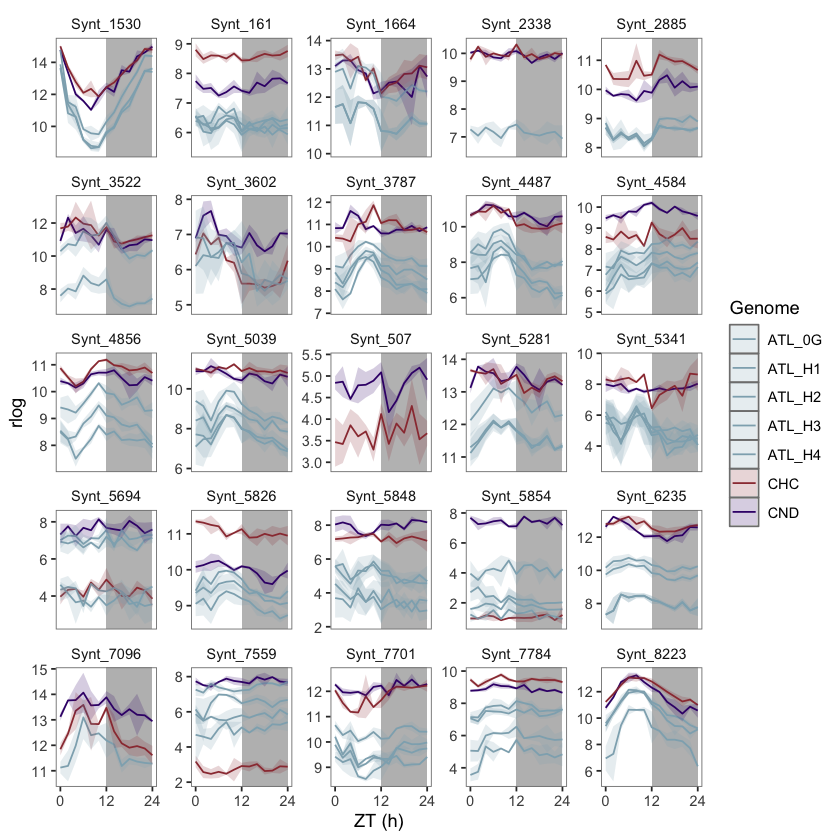

In [50]:
SDL_CHO_Part1 <- All_CHO %>% 
            filter (Condition == 'SD', Tissue == 'Leaf', Syntelog %in%CHOsyn[1:25] ) %>% 
            SD_ribbon_plot_multiple(.,5)                
SDL_CHO_Part1

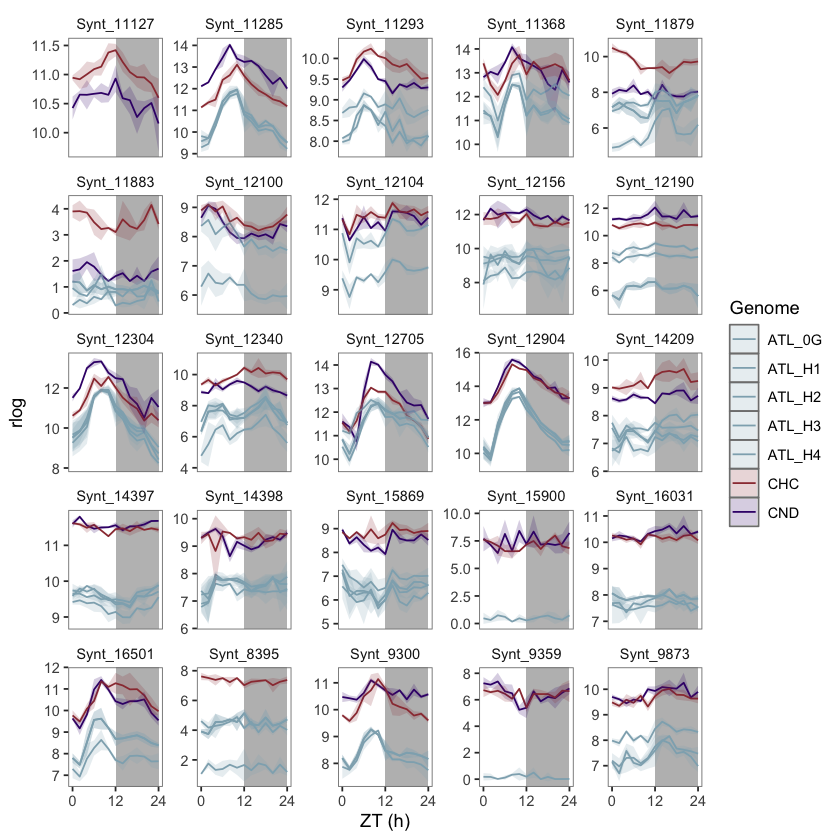

In [51]:
SDL_CHO_Part2 <- All_CHO %>% 
            filter (Condition == 'SD', Tissue == 'Leaf', Syntelog %in%CHOsyn[26:50] ) %>% 
            SD_ribbon_plot_multiple(.,5)                
SDL_CHO_Part2

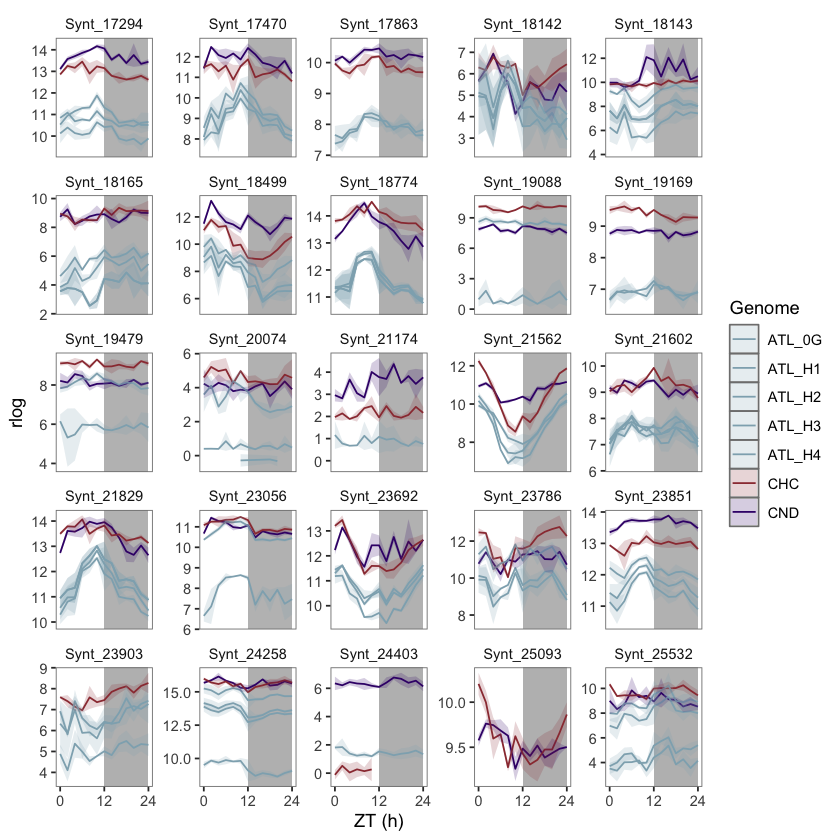

In [52]:
SDL_CHO_Part3 <- All_CHO %>% 
            filter (Condition == 'SD', Tissue == 'Leaf', Syntelog %in%CHOsyn[51:75] ) %>% 
            SD_ribbon_plot_multiple(.,5)                
SDL_CHO_Part3

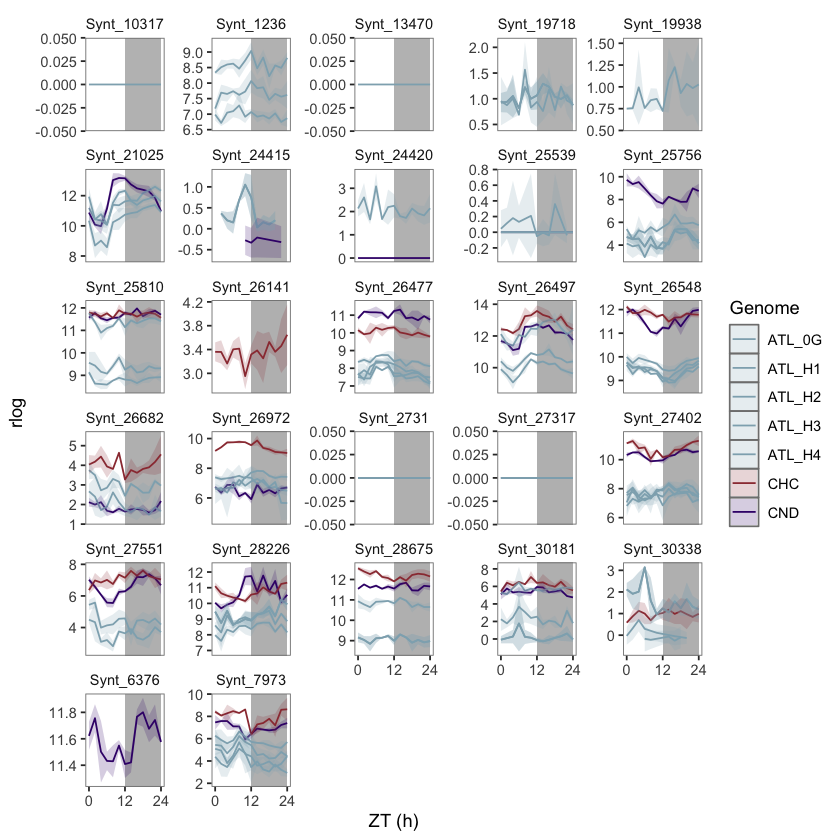

In [81]:
SDL_CHO_Part4 <- All_CHO %>% 
            filter (Condition == 'SD', Tissue == 'Leaf', Syntelog %in%CHOsyn[76:103] ) %>% 
            SD_ribbon_plot_multiple(.,5)                
SDL_CHO_Part4

# Making carbohydrate/starch annotation file

In [54]:
CHO_annotation<- All_CHO %>% select(Syntelog, v6.1_description, MapManAll)%>% unique()

In [101]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'sucrose synthase'))

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_5341,sucrose synthase/sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_18142,sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_18143,sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase/sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_23903,sucrose synthase/sucrose synthase/sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_30181,sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_7973,sucrose synthase,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [312]:
CHO_annotation %>% filter(Syntelog == 'Synt_27551')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_27551,hexokinase-like,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [148]:
CHO_annotation %>% filter(Syntelog == 'Synt_1664')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_1664,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [57]:
CHO_annotation %>% filter(Syntelog == 'Synt_26141')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_26141,Sec14p-like phosphatidylinositol transfer family protein,2.2.1.5 major CHO metabolism.degradation.sucrose.Susy|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [58]:
CHO_annotation %>% filter(Syntelog == 'Synt_507')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_507,Glucose-6-phosphate/phosphate translocator-related,2.2.2 major CHO metabolism.degradation.starch|2.2.2.6 major CHO metabolism.degradation.starch.transporter|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [59]:
CHO_annotation %>% filter(Syntelog == 'Synt_26972')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_26972,cytosolic invertase/cytosolic invertase/cytosolic invertase,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [60]:
# Synt_7559 low in M6
CHO_annotation %>% filter(Syntelog == 'Synt_7559')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_7559,alpha-amylase-like/alpha-amylase-like,2.2.2.1.1 major CHO metabolism.degradation.starch.starch cleavage.alpha amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [73]:
# Synt_8395 high in M6
CHO_annotation %>% filter(Syntelog == 'Synt_8395')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_8395,dual specificity protein phosphatase (DsPTP1) family protein/dual specificity protein phosphatase (DsPTP1) family protein,2.2.2.10 major CHO metabolism.degradation.starch.laforin like phosphoglucan phosphatase (SEX4)|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [80]:
# Synt_27751 high in M6
CHO_annotation %>% filter(Syntelog == 'Synt_27551')

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_27551,hexokinase-like,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


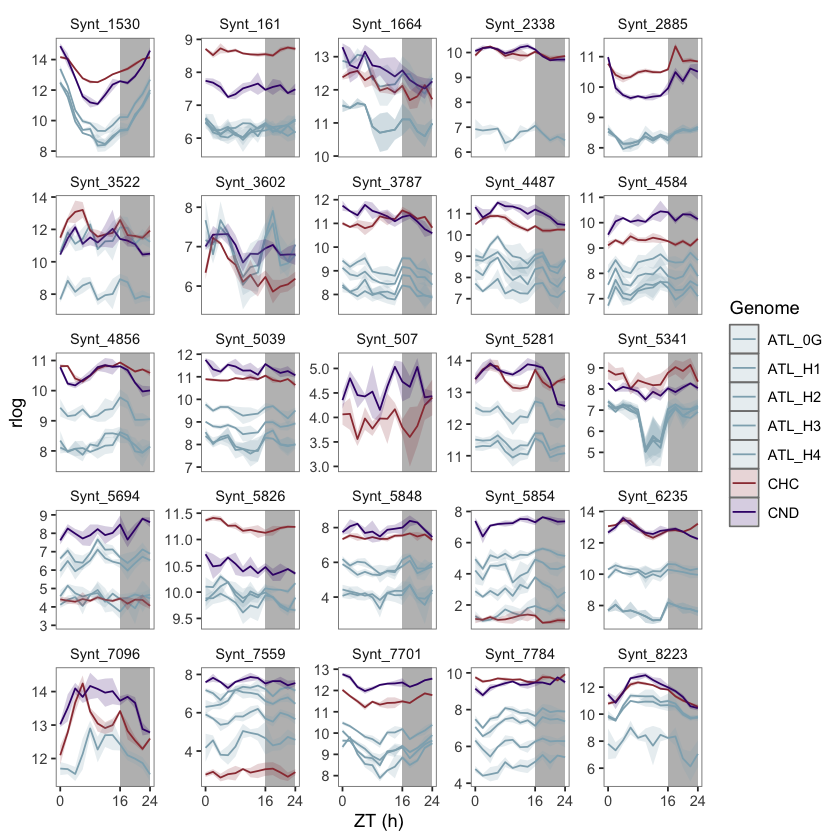

In [62]:
LDL_CHO_Part1 <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', Syntelog %in%CHOsyn[1:25] ) %>% 
            LD_ribbon_plot_multiple(.,5)                
LDL_CHO_Part1

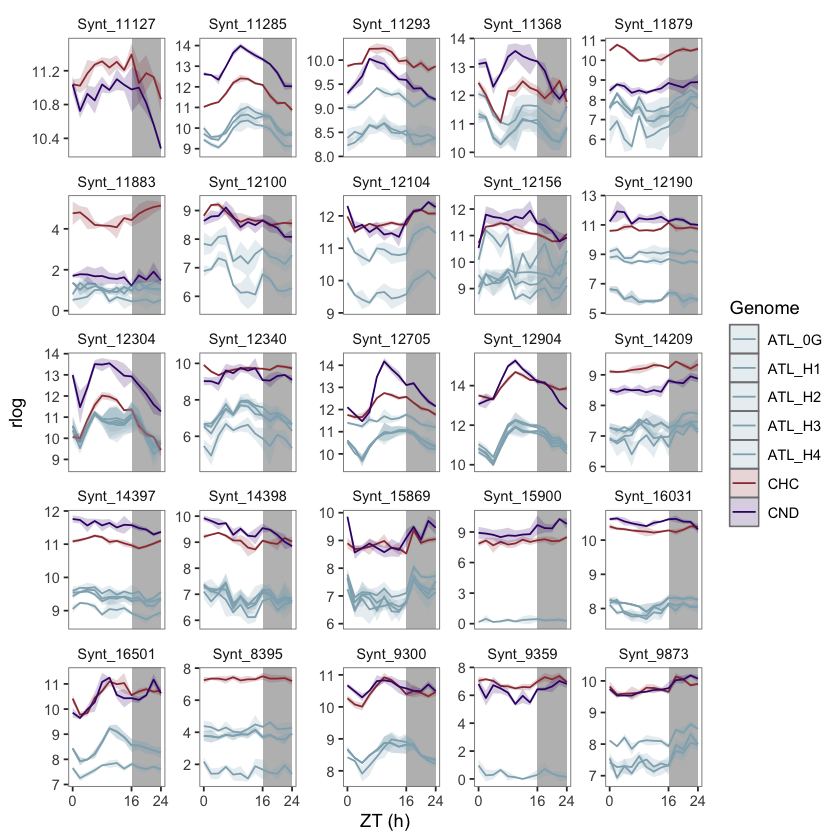

In [63]:
LDL_CHO_Part2 <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', Syntelog %in%CHOsyn[26:50] ) %>% 
            LD_ribbon_plot_multiple(.,5)                
LDL_CHO_Part2

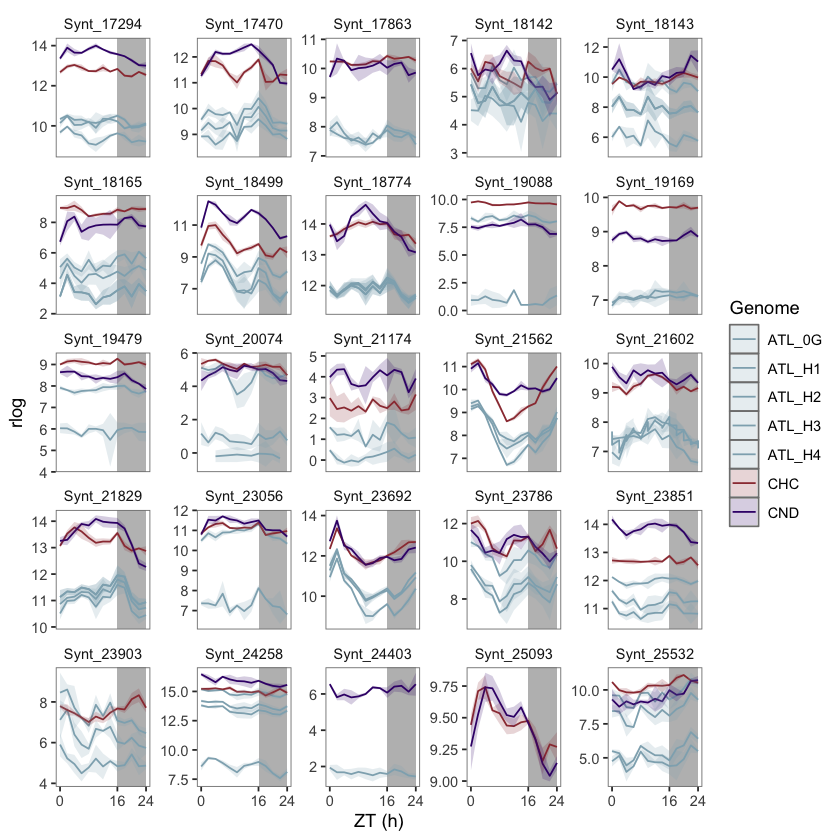

In [64]:
LDL_CHO_Part3 <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', Syntelog %in%CHOsyn[51:75] ) %>% 
            LD_ribbon_plot_multiple(.,5)                
LDL_CHO_Part3

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


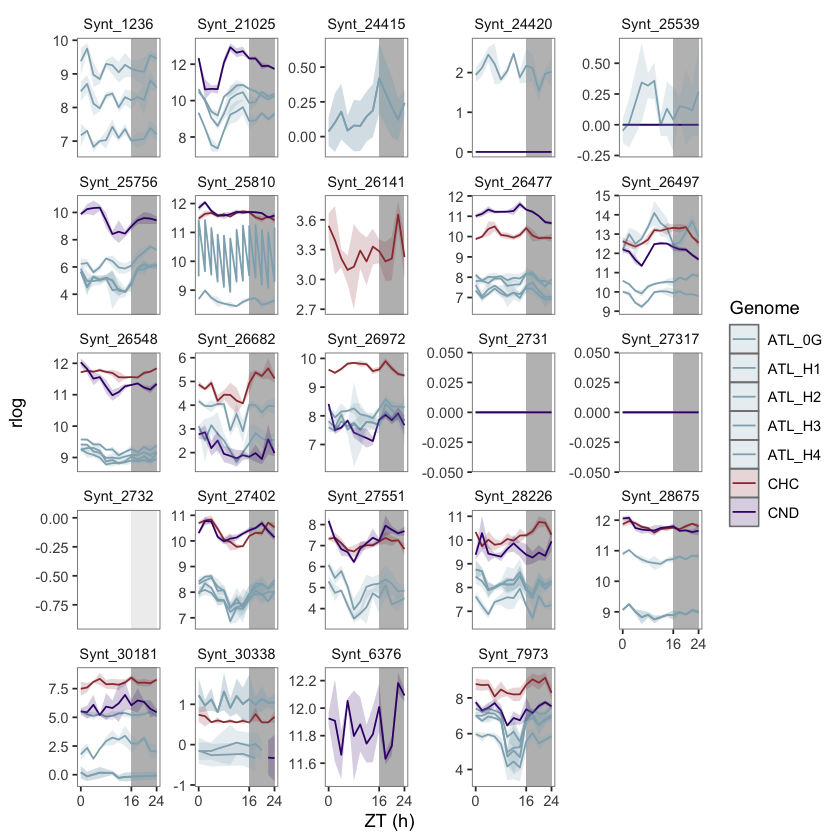

In [65]:
LDL_CHO_Part4 <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', Syntelog %in%CHOsyn[76:99] ) %>% 
            LD_ribbon_plot_multiple(.,5)                
LDL_CHO_Part4

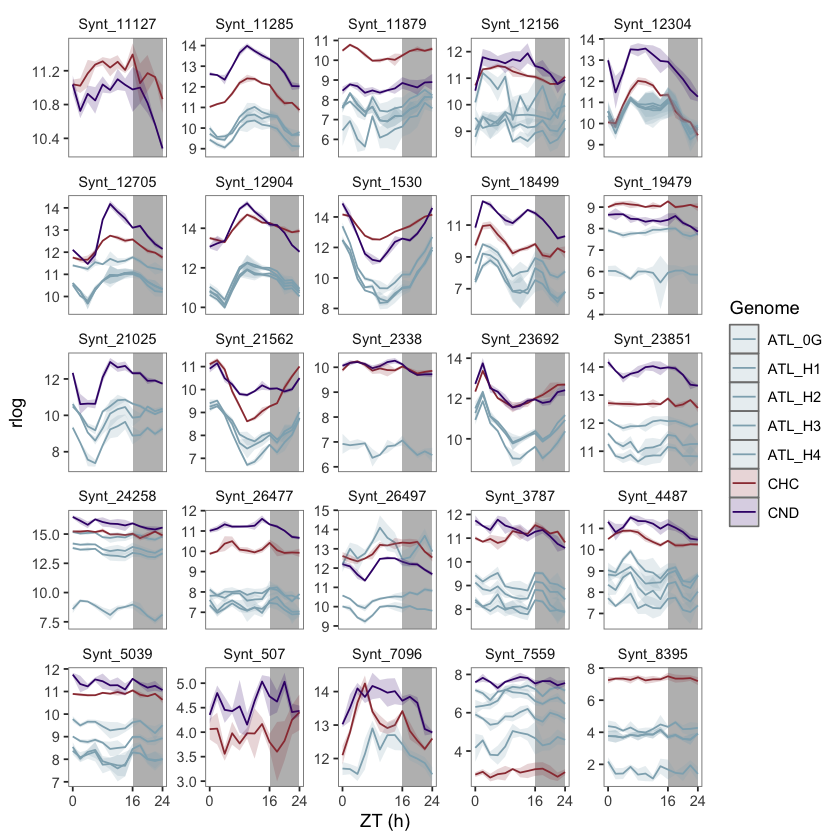

In [87]:
LDL_CHO_StarchDegradation <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', str_detect(MapManAll, 'degradation.starch' )) %>% 
            LD_ribbon_plot_multiple(.,5)                
LDL_CHO_StarchDegradation

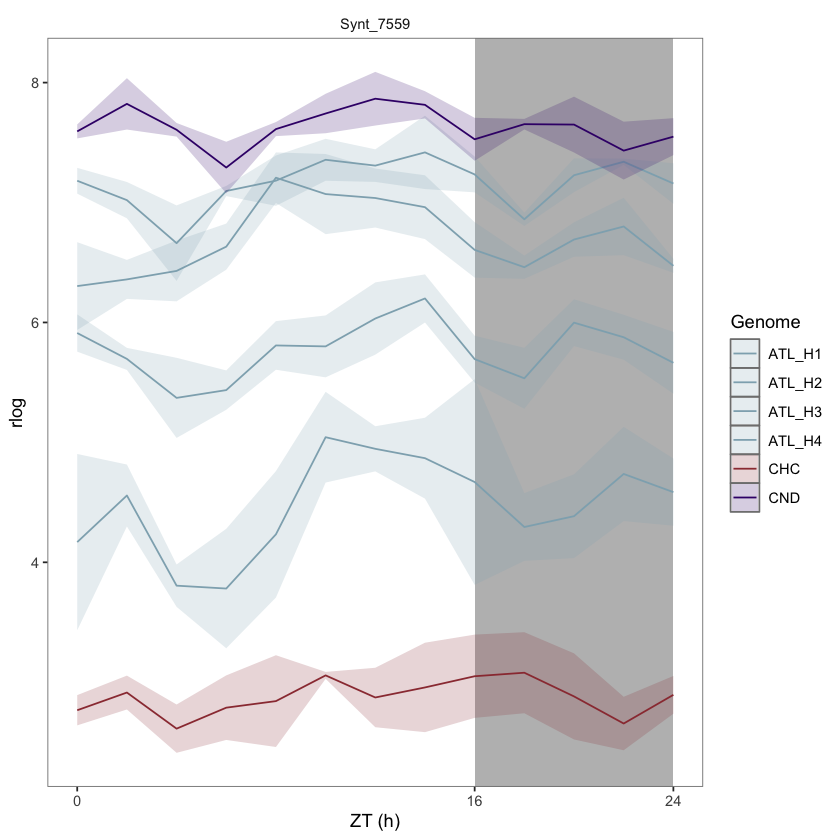

In [97]:

LDL_CHO_Synt_7559 <- All_CHO %>% 
            filter (Condition == 'LD', Tissue == 'Leaf', Syntelog == 'Synt_7559') %>% 
            LD_ribbon_plot_multiple(.,1)                
LDL_CHO_Synt_7559


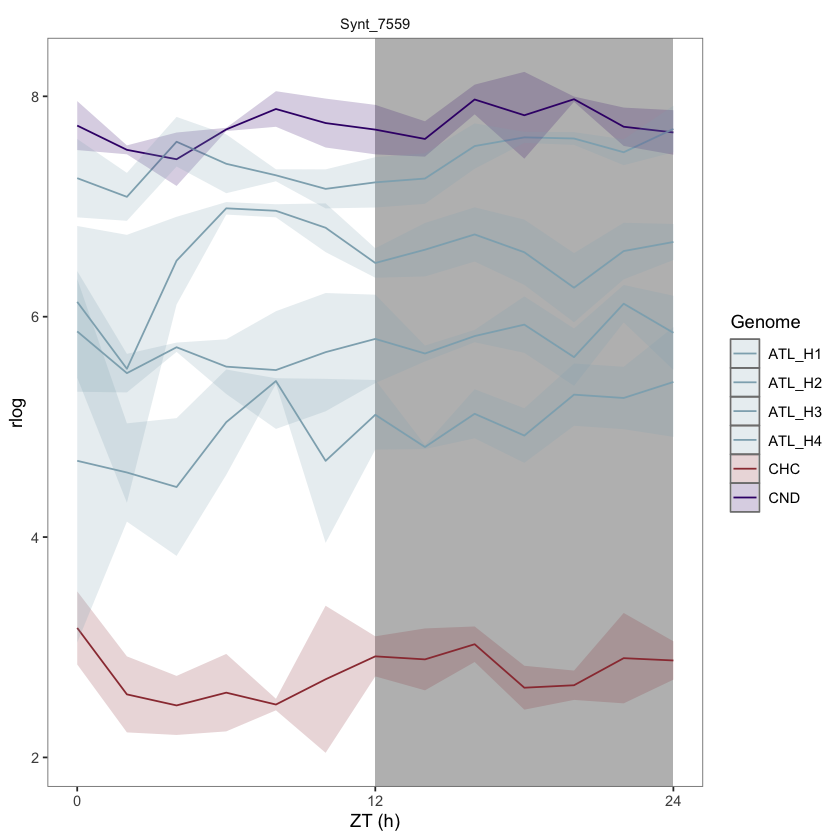

In [98]:

LDL_CHO_Synt_7559 <- All_CHO %>% 
            filter (Condition == 'SD', Tissue == 'Leaf', Syntelog == 'Synt_7559') %>% 
            SD_ribbon_plot_multiple(.,1)                
LDL_CHO_Synt_7559

### SD vs LD plots

In [66]:
#Defining ribbon LD plot 
LDSD_ribbon_plot_multiple <- function(df,columns) {

plot_CHO <- df %>% 
    mutate(Condition = as.factor(Condition))%>%
  ggplot(.,aes(x=ZT,y=mean_expression,col=Condition))+ # this means that all colors below are determined by Genome
   # geom_rect(aes(xmin=12,
             #     xmax = 24,
             #     ymin = -Inf,
              #    ymax = Inf), 
             #    fill = 'grey', alpha = 0.25, color = NA) +
geom_vline(xintercept = 16, linetype="dotted", 
                color = '#000000')+
        geom_vline(xintercept = 12, #linetype="dotted", 
                color = '#000000')+ #, linewidth=0.25
  geom_line(aes(x=ZT,y=mean_expression,col =Condition, group = Condition))+ #group will separate different genes from the same Abbreviation
  geom_ribbon(aes(ymin=mean_expression-std,ymax=mean_expression+std, 
                  fill = Condition, group = Condition),alpha=0.2, linetype = 0)+ 
  facet_wrap(~Syntelog, scales = 'free_y', ncol = columns)+
  theme(strip.background = element_blank(), #removes legend box/grey
        panel.grid =element_blank(),
       panel.background = element_rect(fill = FALSE, colour = "grey50"),
       panel.ontop = TRUE)+
       #legend.position="bottom")+
  scale_y_continuous()+
  scale_x_continuous(breaks=c(0,12,16,24))+
  labs(y="rlog", x="ZT (h)")+
  scale_color_manual(values = c('SD' = '#000000', #black, other color used'#9c3b40',
                                   'LD'= '#5D3FD3'))+ #purple 
    scale_fill_manual(values = alpha(c('SD' = '#000000', #black, 
                                   'LD'= '#5D3FD3'))) #purple   
    }

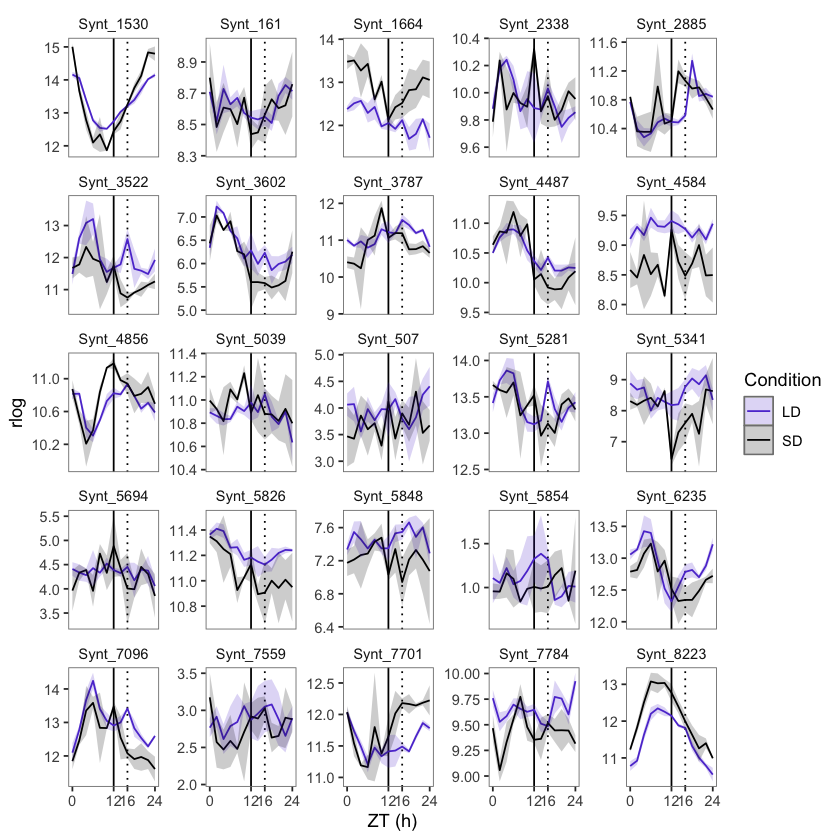

In [67]:
M6_CHO_Part1 <- All_CHO %>% 
            filter (Genome == 'CHC', Syntelog %in%CHOsyn[1:25] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
M6_CHO_Part1

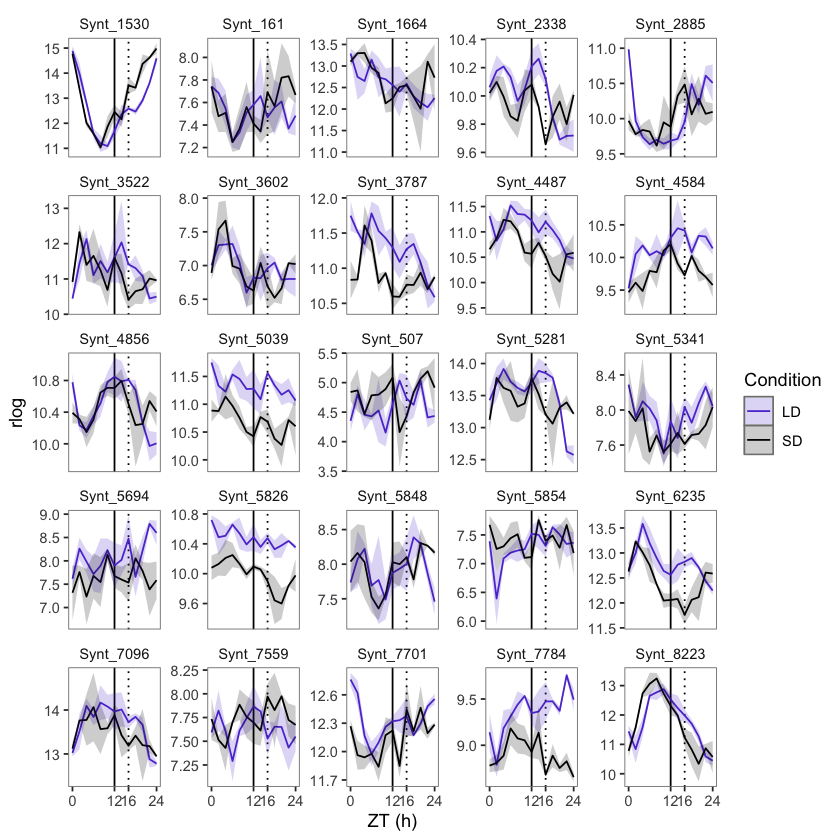

In [68]:
CND_CHO_Part1 <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in%CHOsyn[1:25] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
CND_CHO_Part1

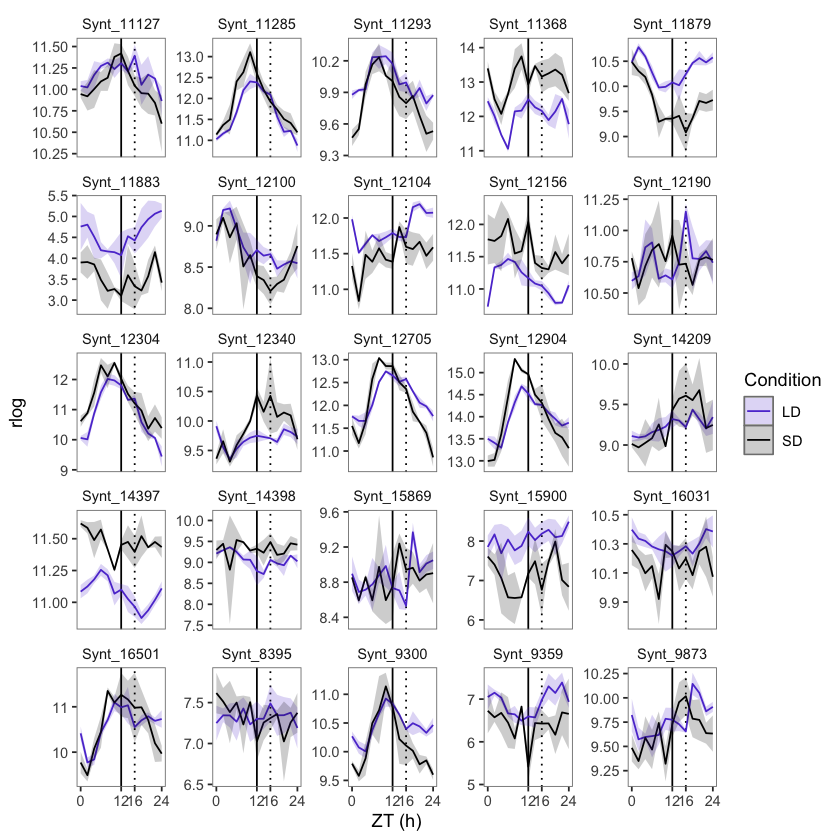

In [69]:
M6_CHO_Part2 <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in%CHOsyn[26:50] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
M6_CHO_Part2

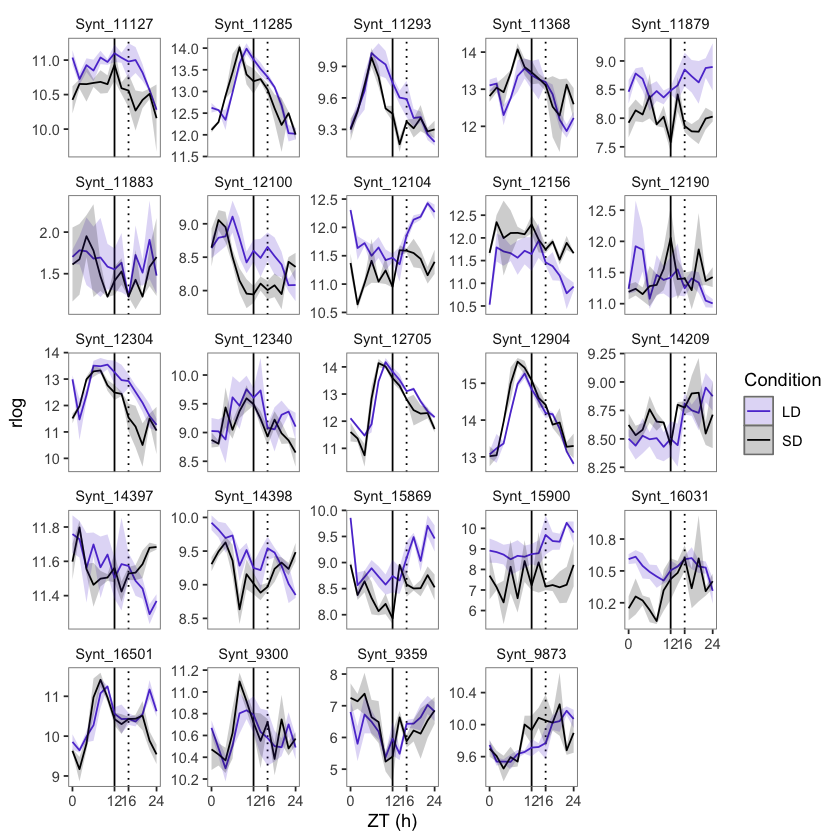

In [70]:
CND_CHO_Part2 <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in%CHOsyn[26:50] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
CND_CHO_Part2

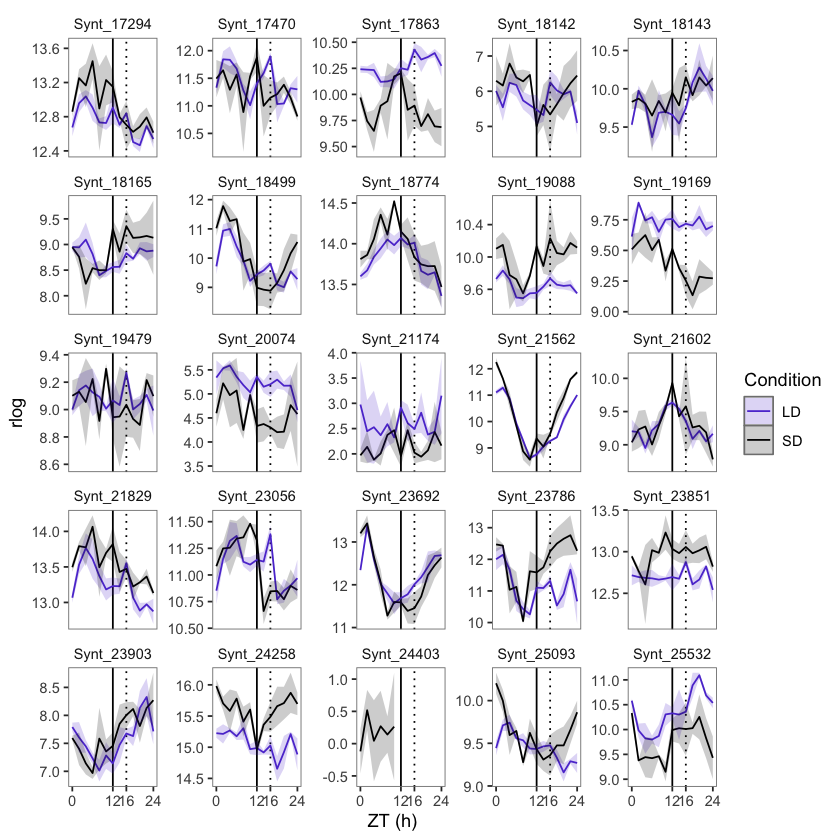

In [76]:
M6_CHO_Part3 <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in%CHOsyn[51:75] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
M6_CHO_Part3

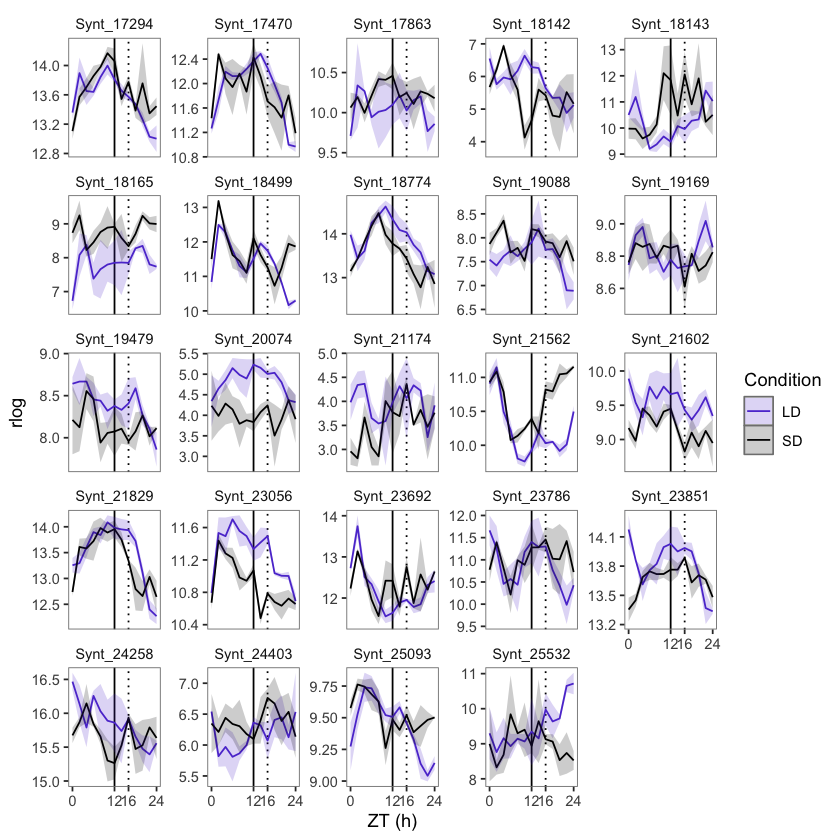

In [77]:
CND_CHO_Part3 <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in%CHOsyn[51:75] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
CND_CHO_Part3

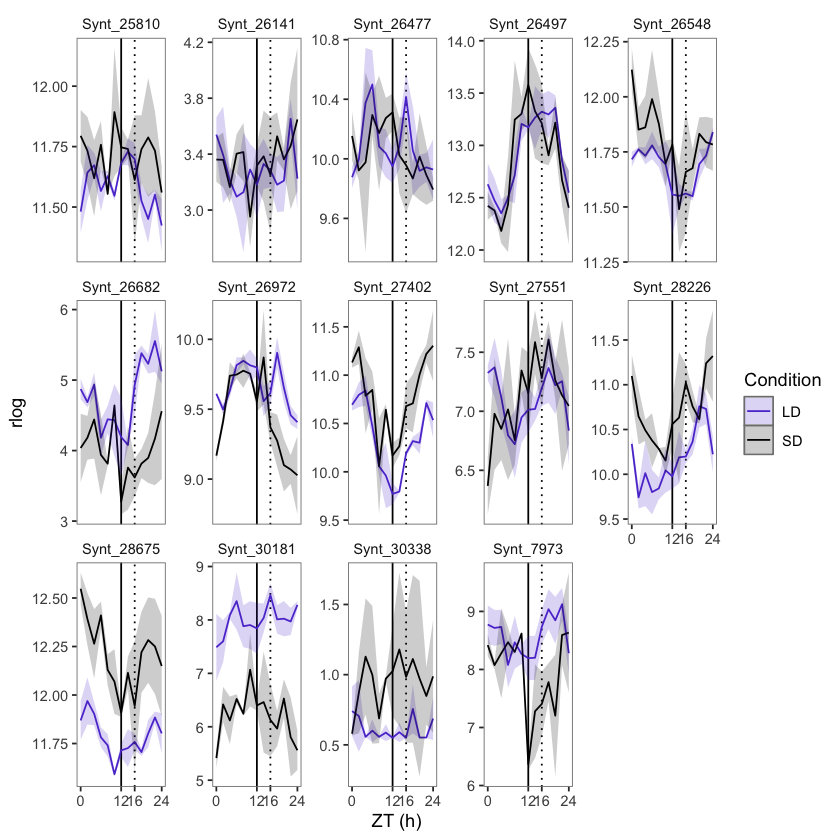

In [78]:
M6_CHO_Part4 <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in%CHOsyn[76:100] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
M6_CHO_Part4

`geom_line()`: Each group consists of only one observation.
ℹ Do you need to adjust the group aesthetic?


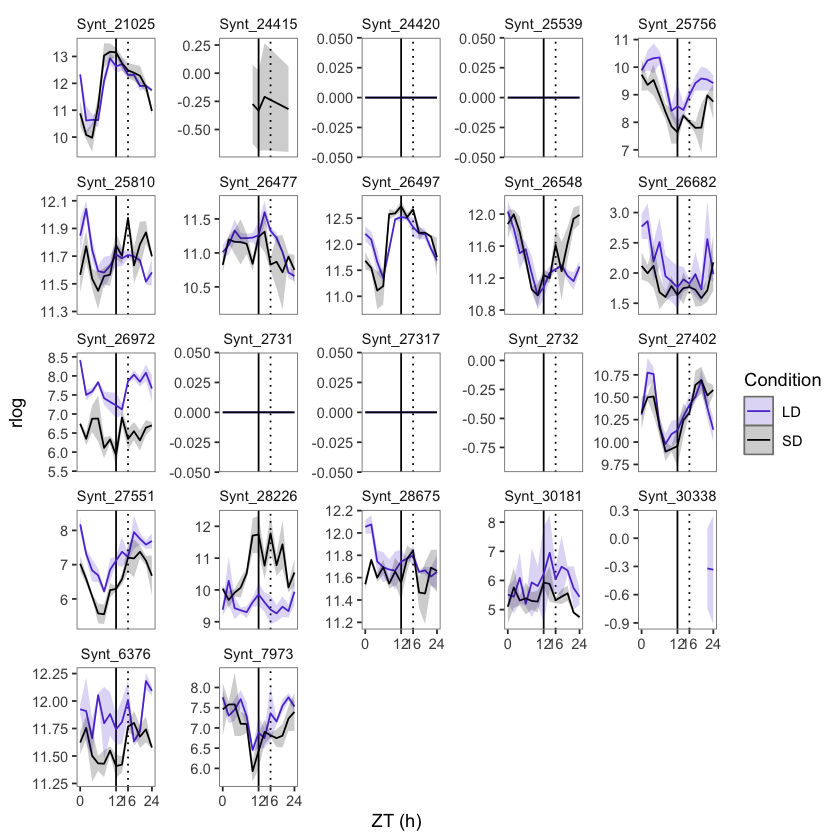

In [79]:
CND_CHO_Part4 <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in%CHOsyn[76:100] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
CND_CHO_Part4

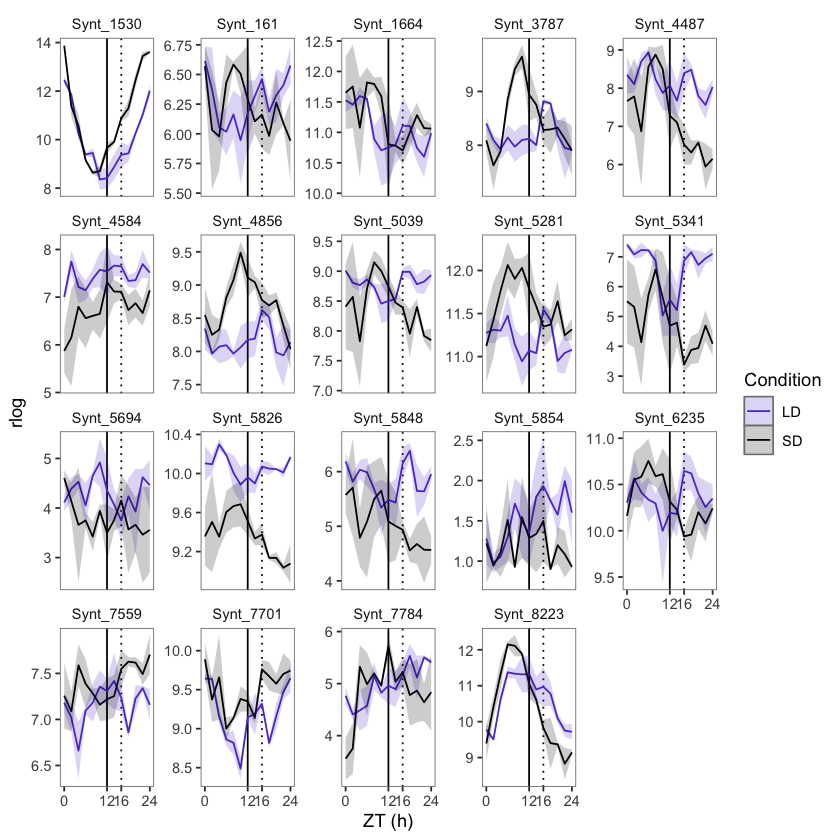

In [71]:
ATL_CHO_Part1 <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in%CHOsyn[1:25] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
ATL_CHO_Part1

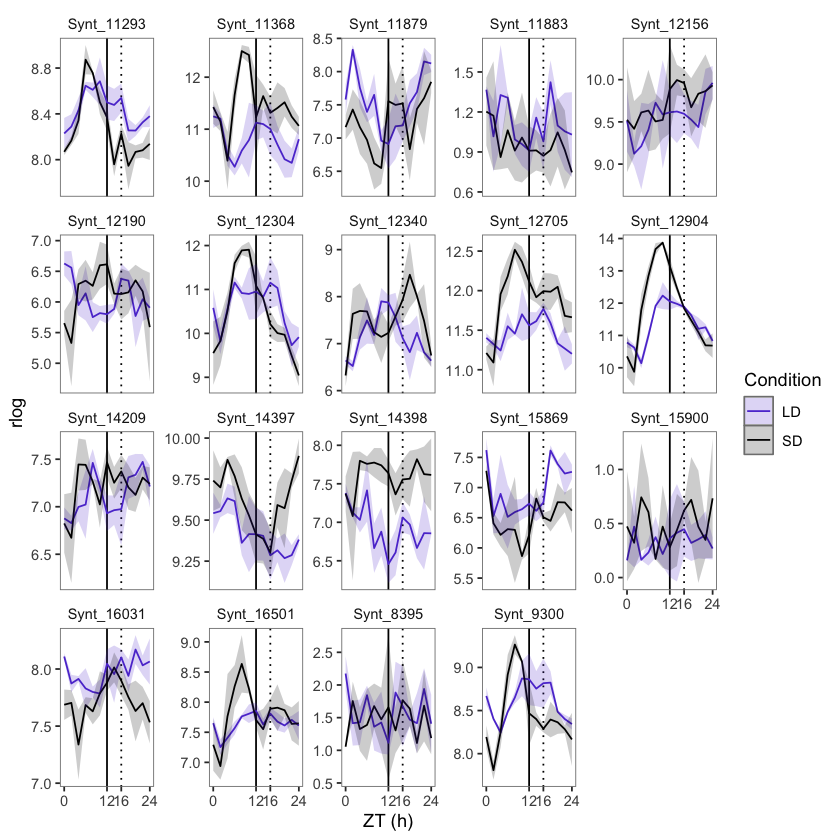

In [75]:
ATL_CHO_Part2 <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in%CHOsyn[26:50] ) %>% 
            LDSD_ribbon_plot_multiple(.,5)                
ATL_CHO_Part2

## Sucrose synthase

In [108]:
# Sucrose synthase genes
#::::::::::::::::::::::::::::::
Susy<- CHO_annotation %>% filter(str_detect(v6.1_description, 'sucrose synthase')) %>% select(Syntelog)

ERROR: Error in eval(expr, envir, enclos): object 'Susy' not found


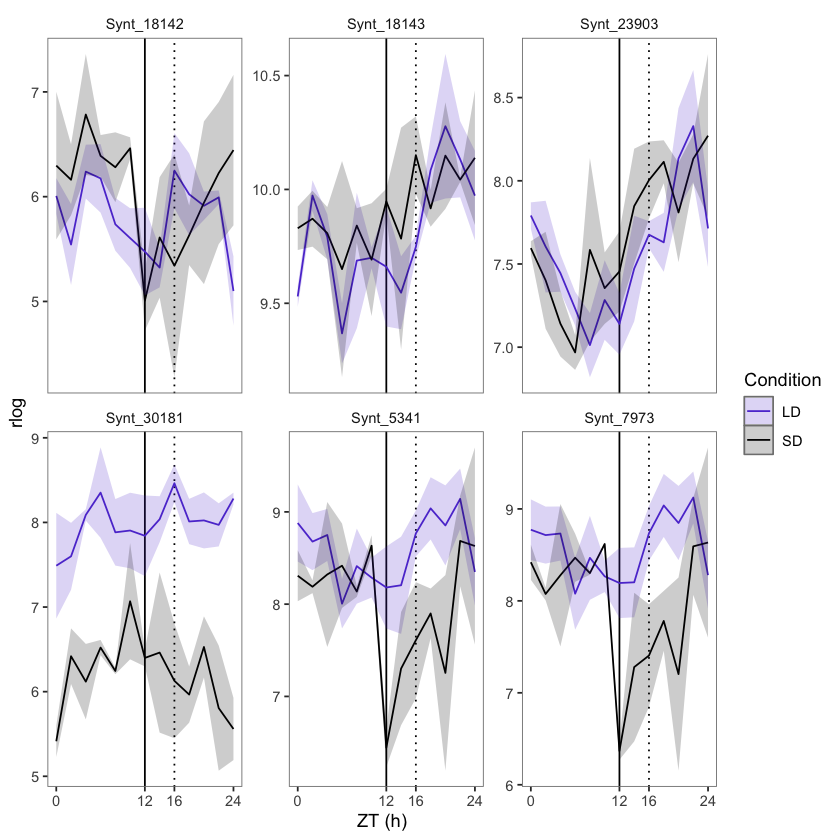

In [111]:
CHC_Susy <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% Susy$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_Susy

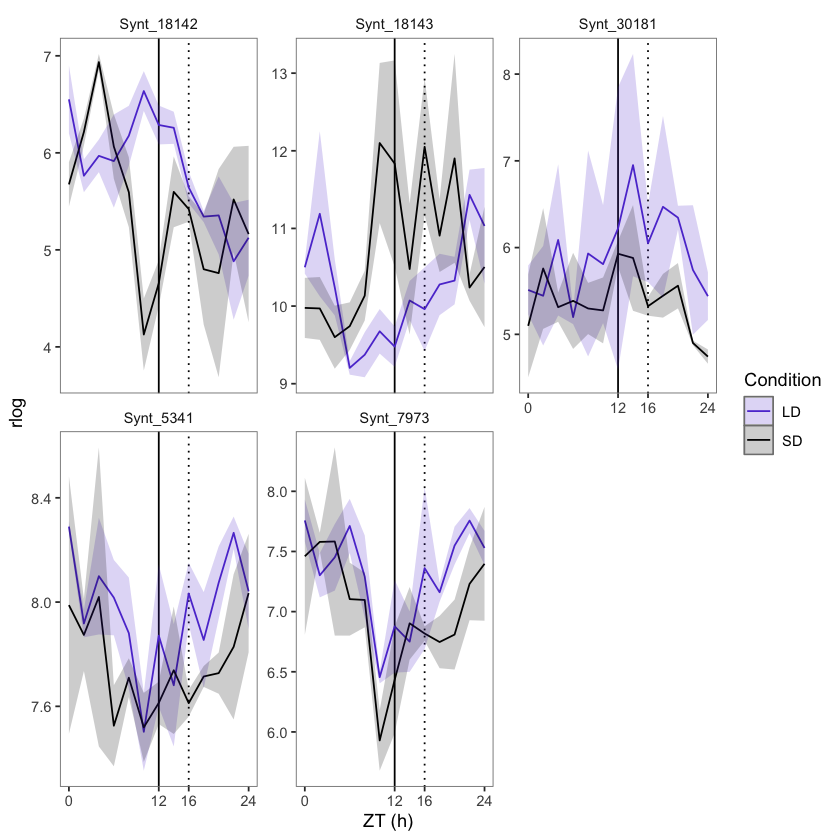

In [113]:
CND_Susy <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% Susy$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CND_Susy

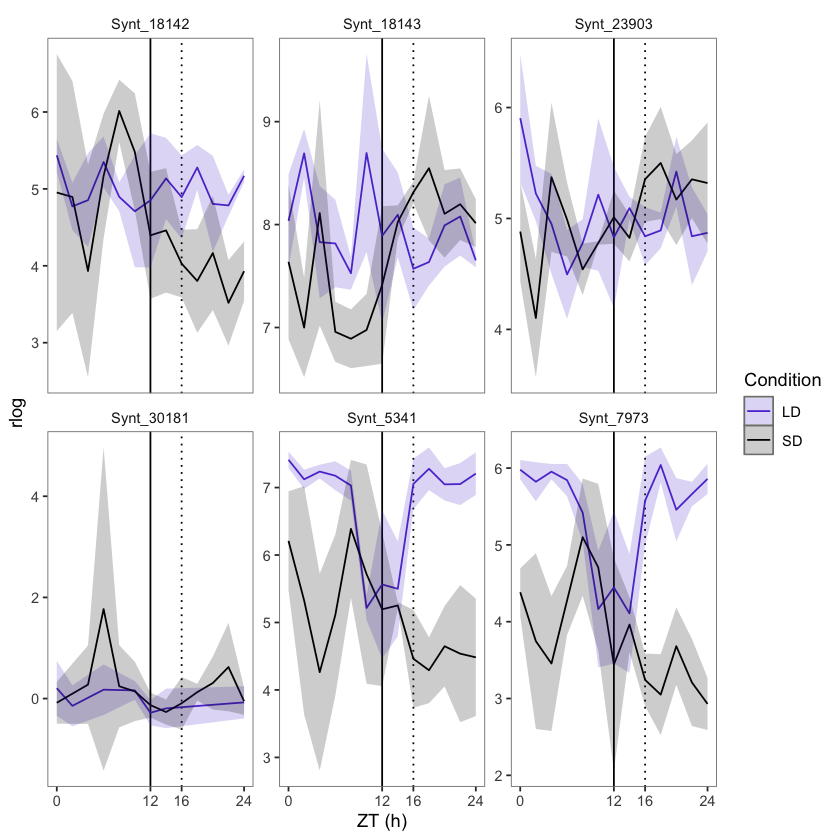

In [123]:
ATL_Susy <- All_CHO %>% 
            filter (str_detect(Genome, 'ATL_H1'), Tissue == 'Leaf', Syntelog %in% Susy$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_Susy

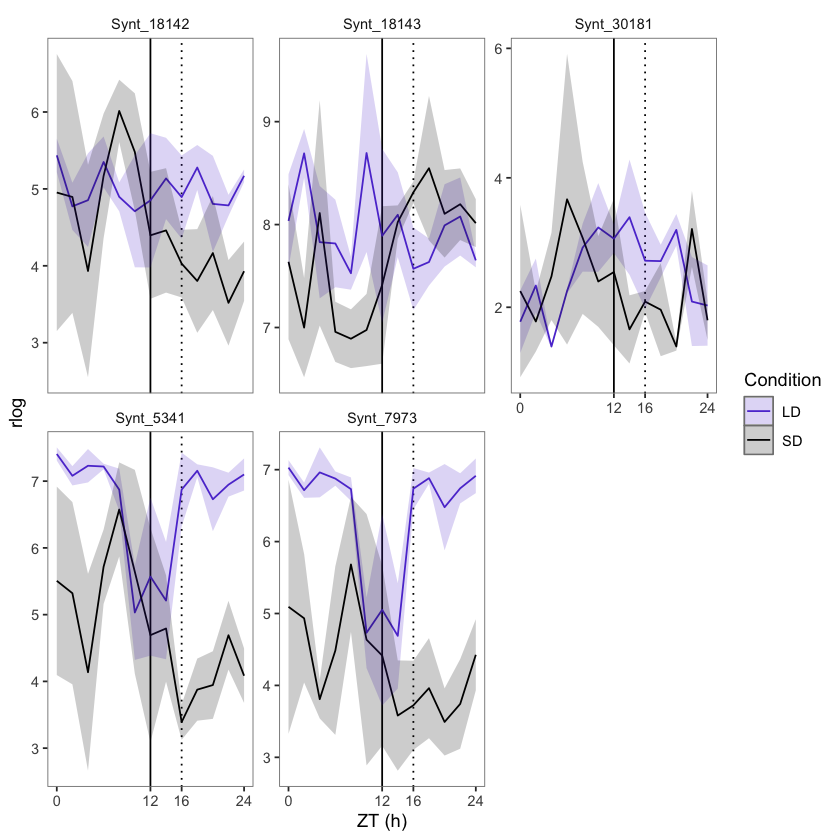

In [124]:
ATL_Susy <- All_CHO %>% 
            filter (str_detect(Genome, 'ATL_H2'), Tissue == 'Leaf', Syntelog %in% Susy$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_Susy

In [114]:
CHO_annotation[1:2,]

,Syntelog,v6.1_description,MapManAll
,<chr>,<chr>,<chr>
1,Synt_161,Sucrose-6F-phosphate phosphohydrolase family protein/Sucrose-6F-phosphate phosphohydrolase family protein,2 major CHO metabolism|2.1 major CHO metabolism.synthesis|2.1.1 major CHO metabolism.synthesis.sucrose|2.1.1.2 major CHO metabolism.synthesis.sucrose.SPP
27,Synt_507,Glucose-6-phosphate/phosphate translocator-related,2.2.2 major CHO metabolism.degradation.starch|2.2.2.6 major CHO metabolism.degradation.starch.transporter|2.2 major CHO metabolism.degradation|2 major CHO metabolism


## Beta-amylase
Note: in Arabidopsis, loss of function leads to starch accumulation in leaves

https://academic.oup.com/plphys/article/188/1/191/6400261

In [118]:
beta_amylase <- CHO_annotation %>% filter(str_detect(v6.1_description, 'beta-amylase')) %>% select(Syntelog)

In [142]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'beta-amylase'))

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_1530,beta-amylase/beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_2338,beta-amylase,2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_18499,beta-amylase,2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_19479,beta-amylase,2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_23692,beta-amylase,2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_21025,chloroplast beta-amylase,2.2.2.1.2 major CHO metabolism.degradation.starch.starch cleavage.beta amylase|2.2.2.1 major CHO metabolism.degradation.starch.starch cleavage|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


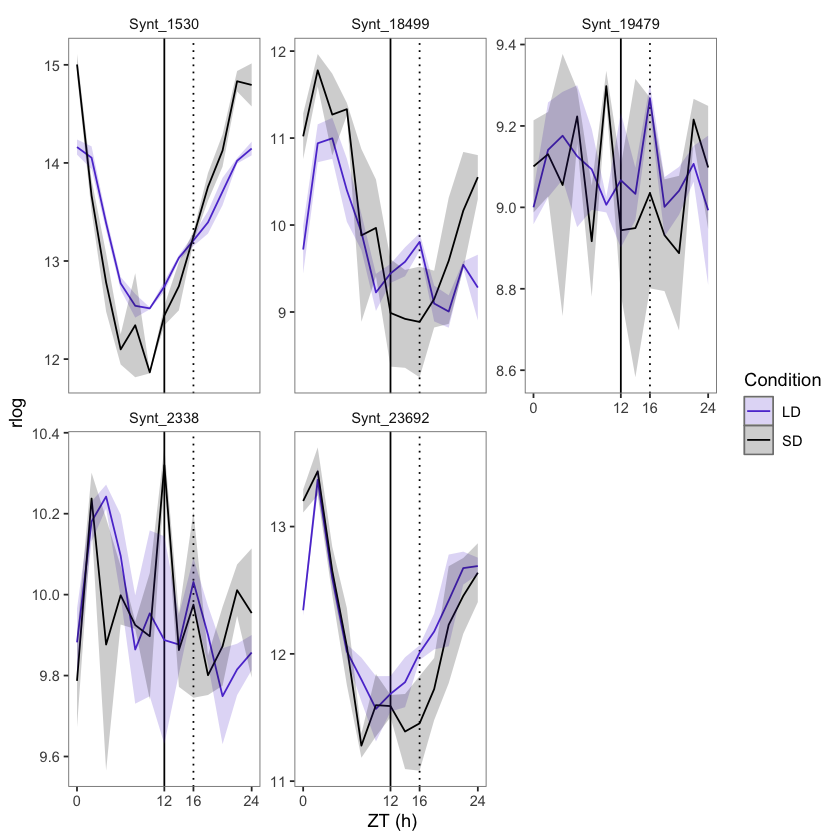

In [119]:
CHC_beta_amylase <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% beta_amylase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_beta_amylase

### Note: Synt_21025 does not seem to be present in CHC

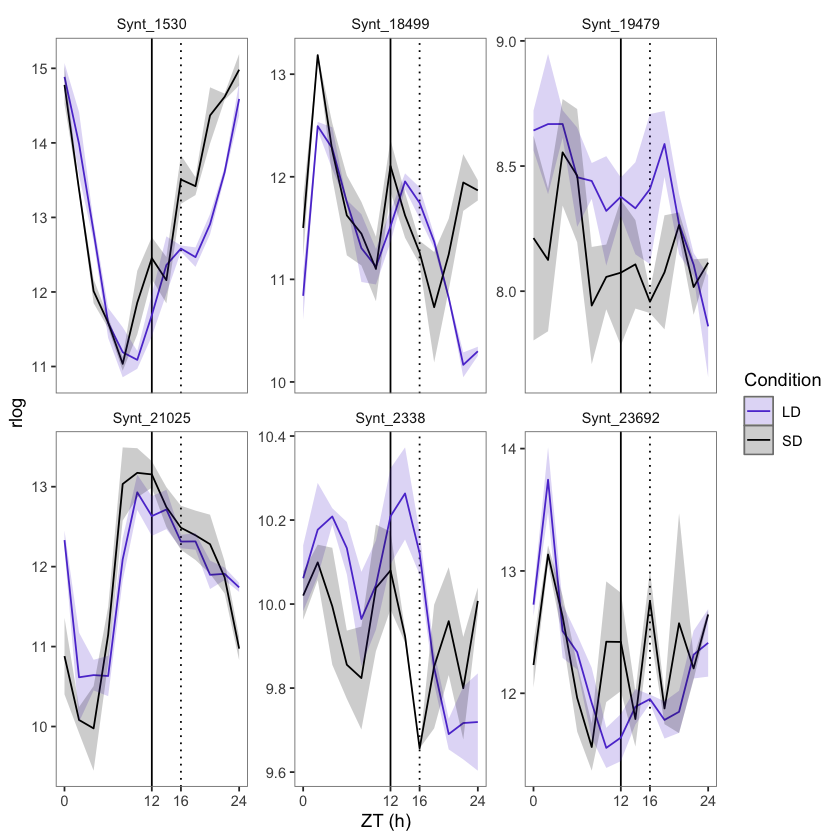

In [120]:
CND_beta_amylase <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% beta_amylase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CND_beta_amylase

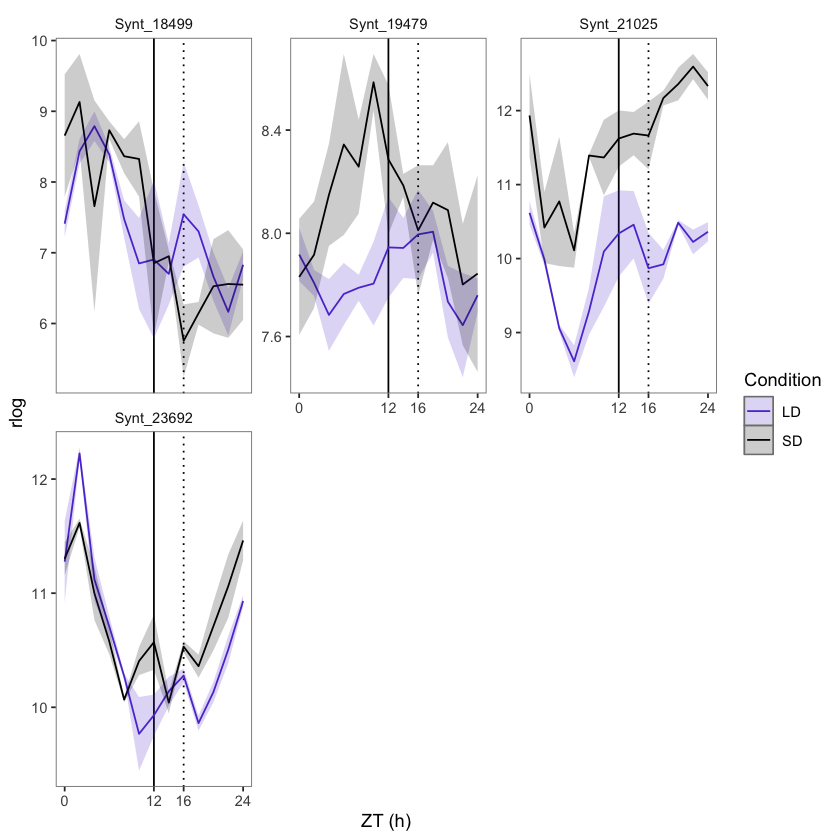

In [145]:
ATL_beta_amylase <- All_CHO %>% 
            filter (Genome == 'ATL_H1', Tissue == 'Leaf', Syntelog %in% beta_amylase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_beta_amylase

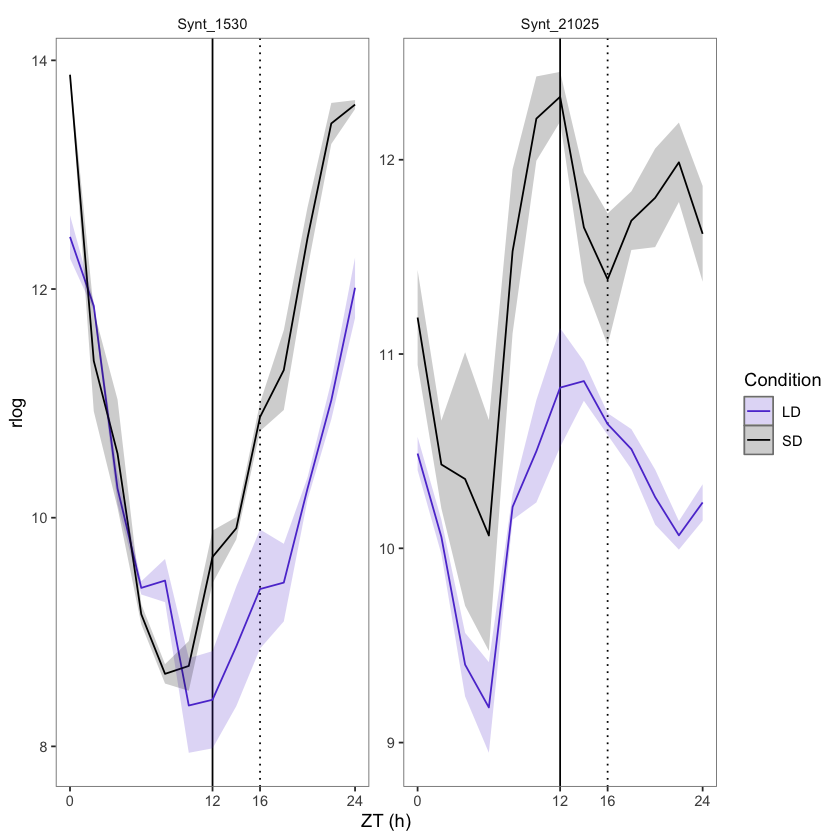

In [146]:
ATL_beta_amylase <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in% beta_amylase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_beta_amylase

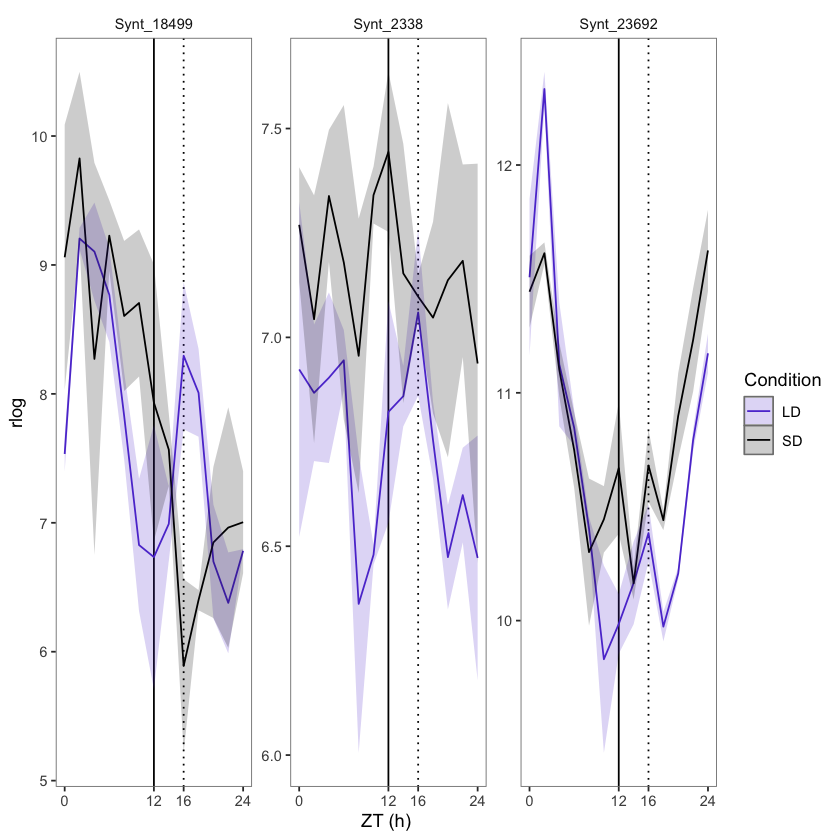

In [147]:
ATL_beta_amylase <- All_CHO %>% 
            filter (Genome == 'ATL_H3', Tissue == 'Leaf', Syntelog %in% beta_amylase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_beta_amylase

In [127]:
Invertase <- CHO_annotation %>% filter(str_detect(v6.1_description, 'invertase')) %>% select(Syntelog)

In [133]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'invertase')) 

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_2885,Plant neutral invertase family protein,2.2.1 major CHO metabolism.degradation.sucrose|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_3602,Plant neutral invertase family protein,2.2.1 major CHO metabolism.degradation.sucrose|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_12104,Plant neutral invertase family protein/Plant neutral invertase family protein,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_15869,cytosolic invertase,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_26548,alkaline/neutral invertase/alkaline/neutral invertase,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_26972,cytosolic invertase/cytosolic invertase/cytosolic invertase,2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_25539,cell wall invertase,2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_25756,cell wall invertase/cell wall invertase,2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_1236,Plant neutral invertase family protein,2.2 major CHO metabolism.degradation|2.2.1 major CHO metabolism.degradation.sucrose|2.2.1.3 major CHO metabolism.degradation.sucrose.invertases|2.2.1.3.1 major CHO metabolism.degradation.sucrose.invertases.neutral|2 major CHO metabolism


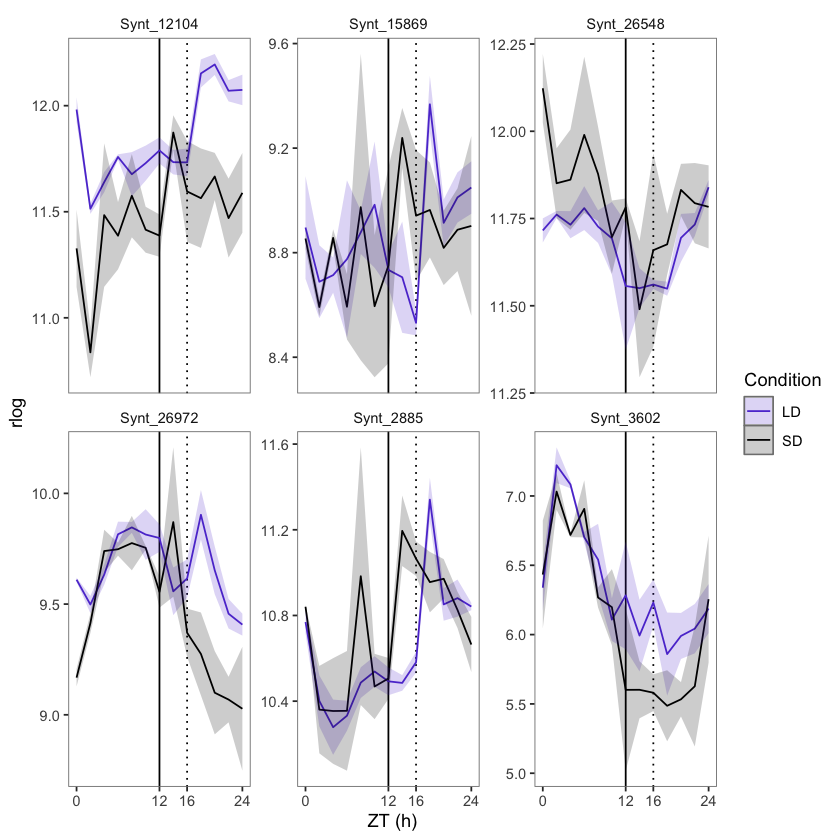

In [128]:
CHC_invertase <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% Invertase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_invertase

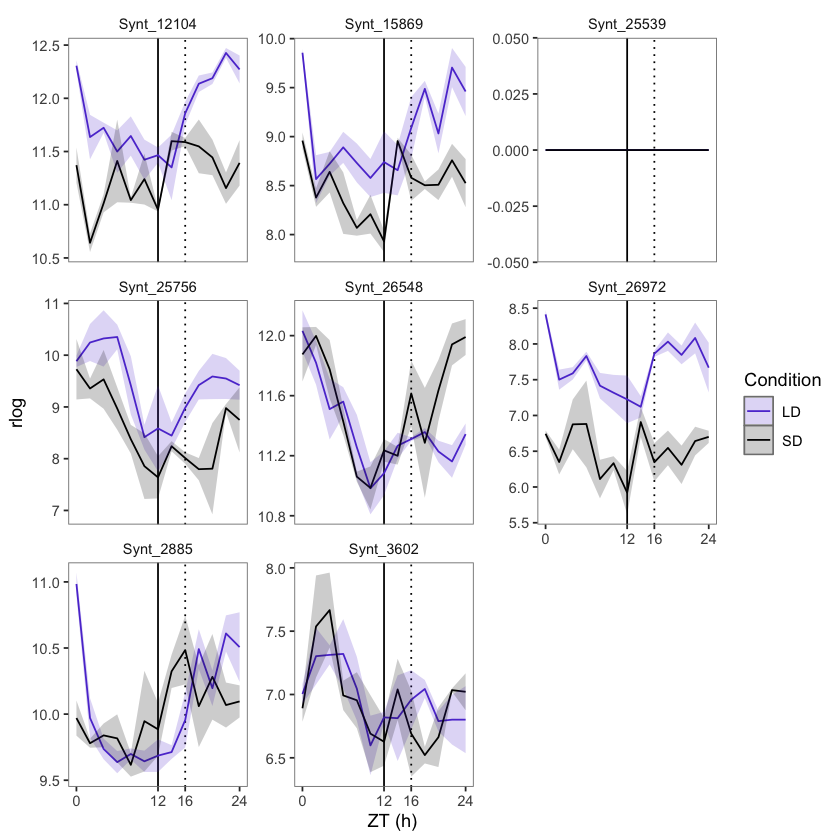

In [129]:
CND_invertase <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% Invertase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CND_invertase

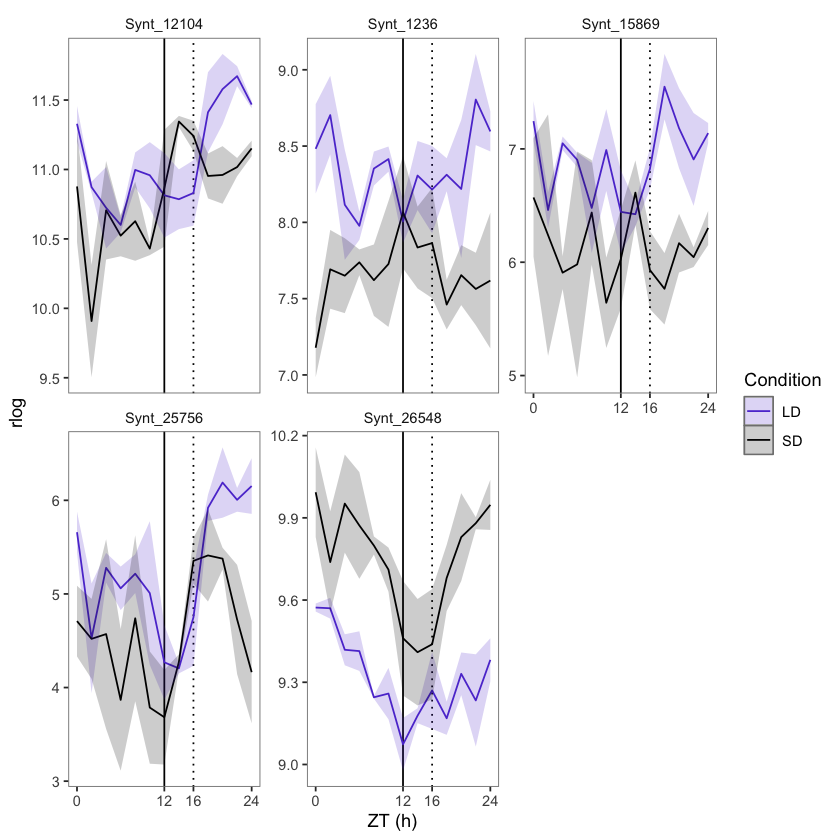

In [130]:
ATL_invertase <- All_CHO %>% 
            filter (Genome == 'ATL_H1', Tissue == 'Leaf', Syntelog %in% Invertase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_invertase

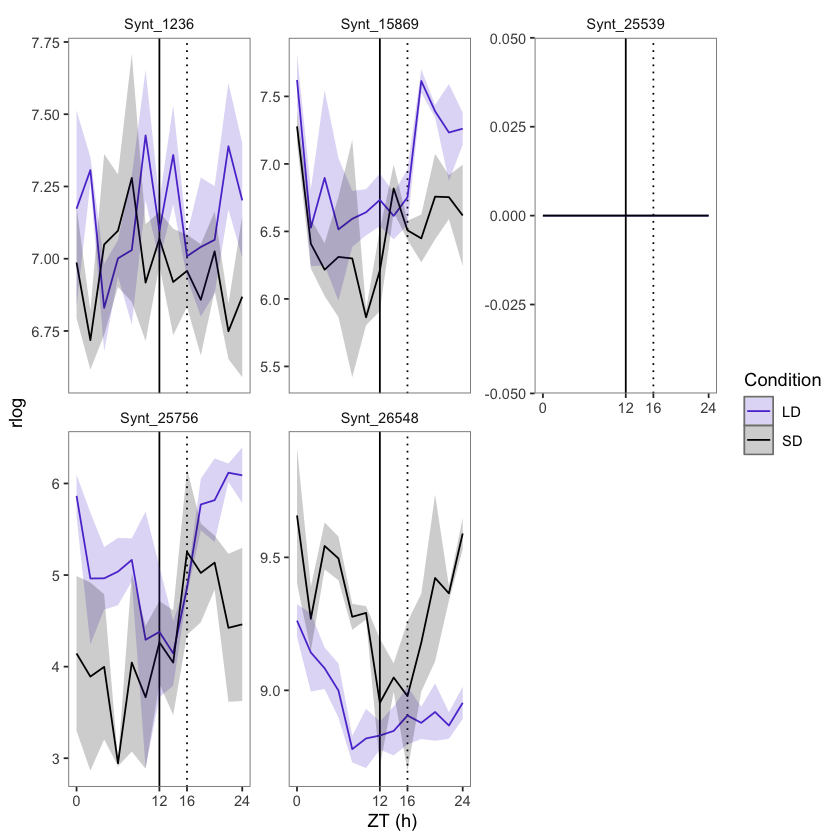

In [131]:
ATL_invertase <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in% Invertase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_invertase

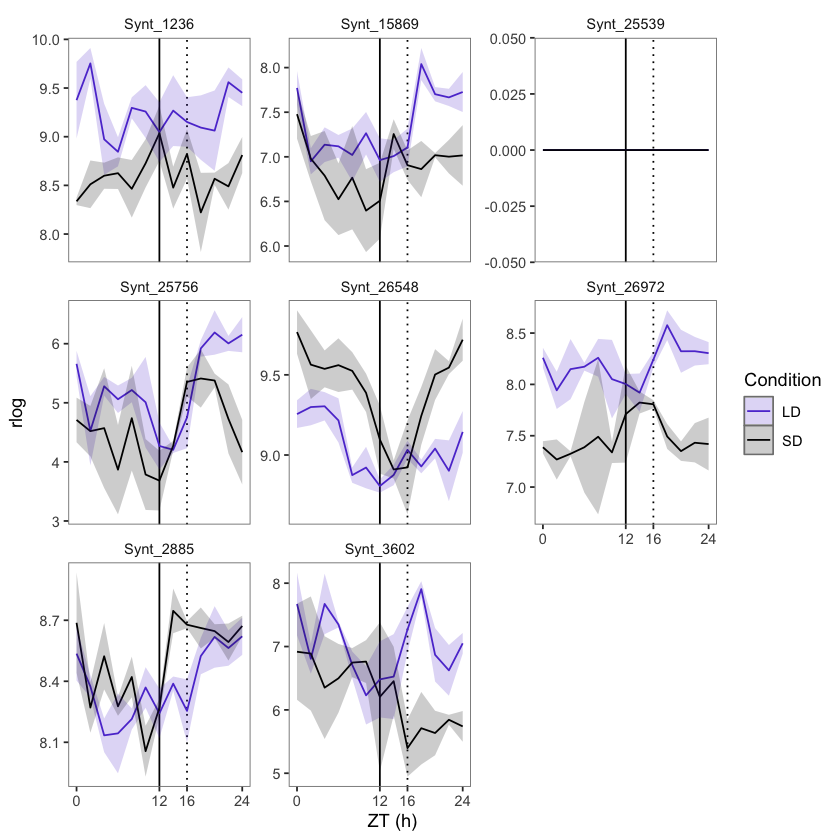

In [132]:
ATL_invertase <- All_CHO %>% 
            filter (Genome == 'ATL_H3', Tissue == 'Leaf', Syntelog %in% Invertase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_invertase

In [135]:
 hexokinase <- CHO_annotation %>% filter(str_detect(v6.1_description, 'hexokinase')) %>% select(Syntelog)

In [141]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'hexokinase'))

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_5854,hexokinase-like/hexokinase-like,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_9300,hexokinase,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_12100,hexokinase/hexokinase,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_16031,hexokinase,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism
Synt_27551,hexokinase-like,2.2.1.4 major CHO metabolism.degradation.sucrose.hexokinase|2.2.1 major CHO metabolism.degradation.sucrose|2.2 major CHO metabolism.degradation|2 major CHO metabolism


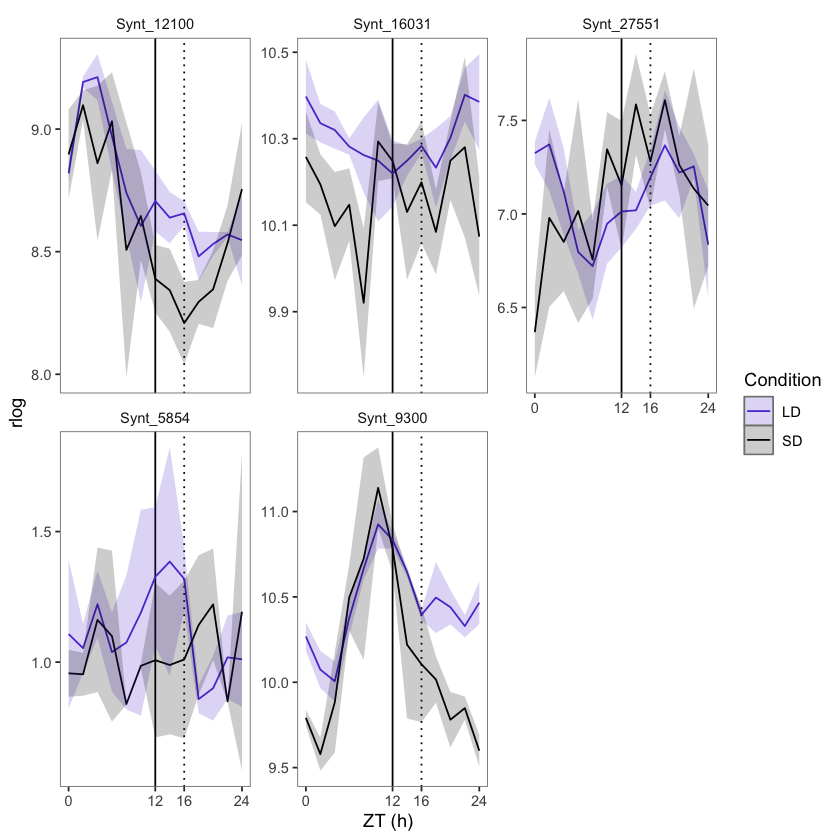

In [136]:
CHC_hexokinase <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% hexokinase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_hexokinase

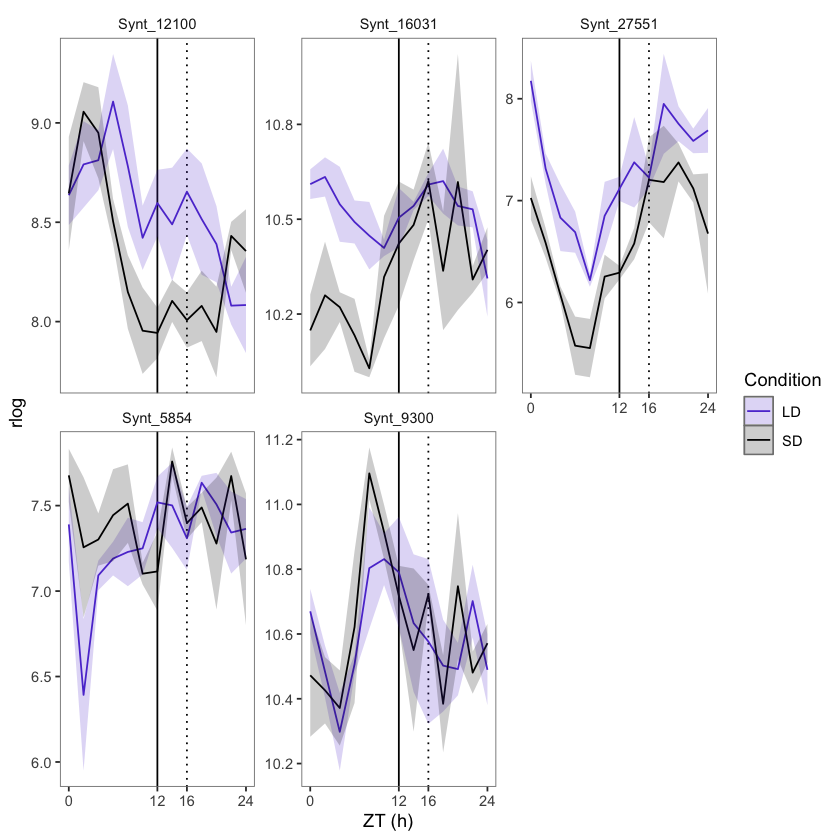

In [137]:
CND_hexokinase <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% hexokinase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CND_hexokinase

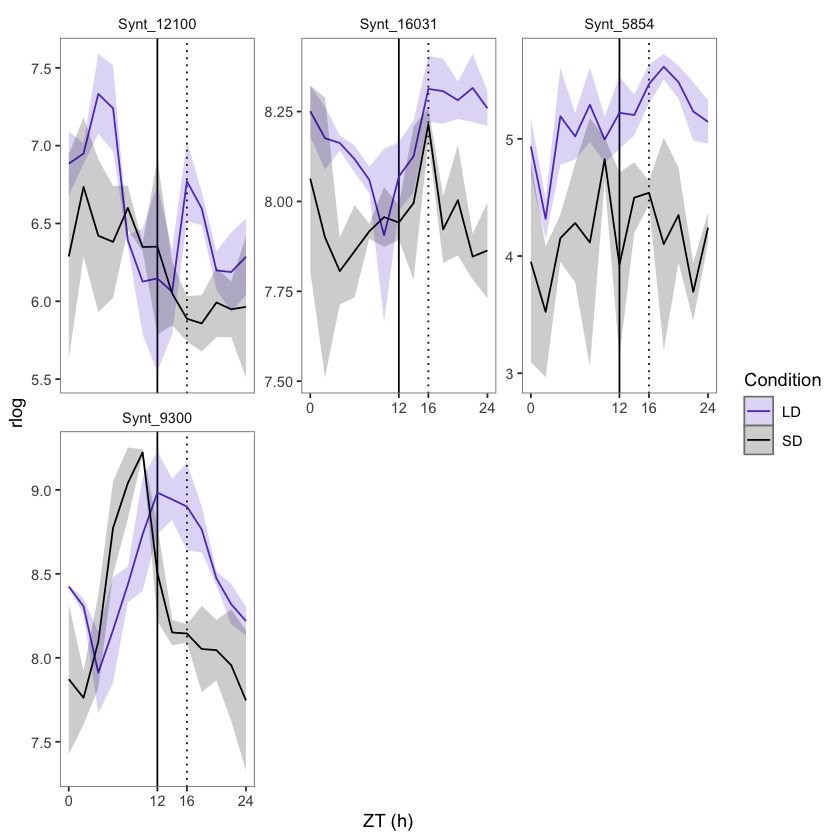

In [138]:
ATL_hexokinase <- All_CHO %>% 
            filter (Genome == 'ATL_H1', Tissue == 'Leaf', Syntelog %in% hexokinase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_hexokinase

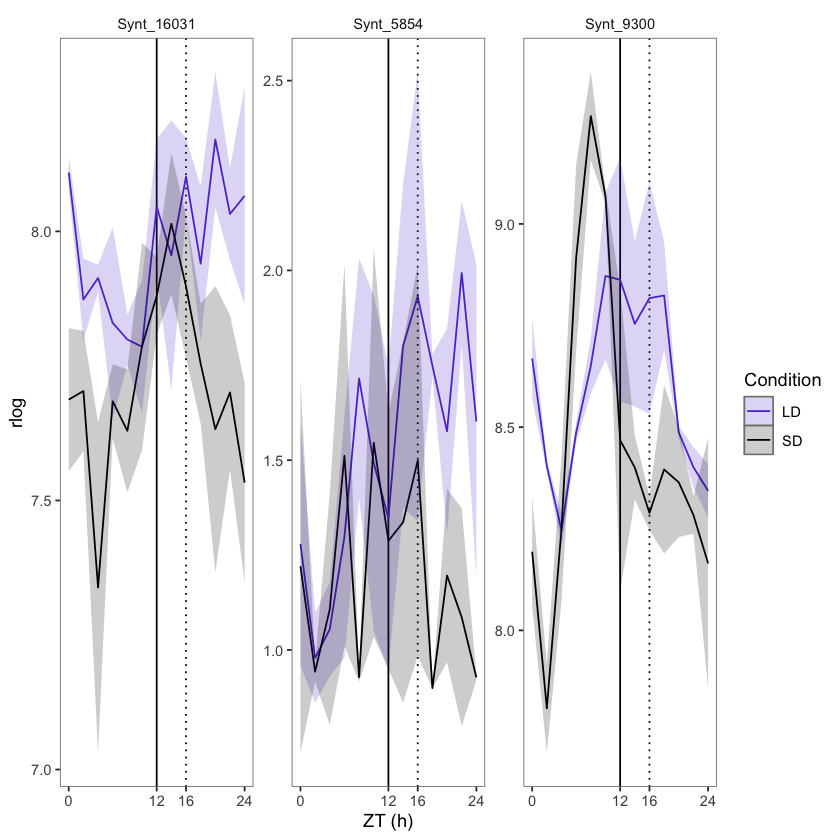

In [139]:
ATL_hexokinase <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in% hexokinase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_hexokinase

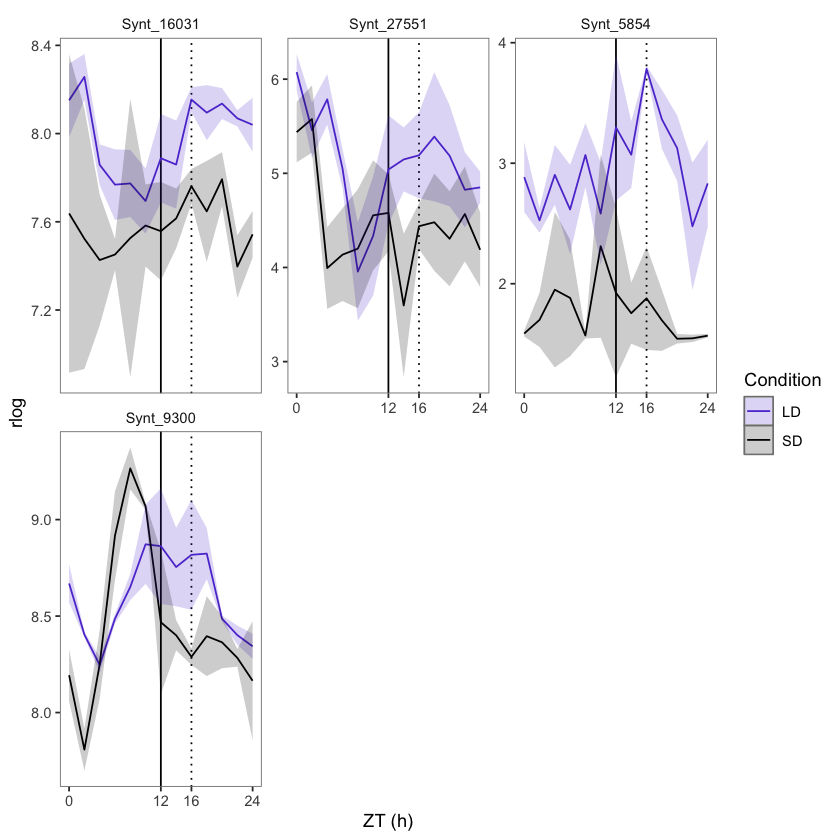

In [140]:
ATL_hexokinase <- All_CHO %>% 
            filter (Genome == 'ATL_H3', Tissue == 'Leaf', Syntelog %in% hexokinase$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_hexokinase

## SPS

In [150]:
# Sucrose phosphate synthase
#::::::::::::::::::::::::::::::
CHO_annotation %>% filter(str_detect(v6.1_description, 'sucrose phosphate')) #%>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_17294,sucrose phosphate synthase 1F,2.1.1.1 major CHO metabolism.synthesis.sucrose.SPS|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_20074,sucrose phosphate synthase 2F,2.1.1.1 major CHO metabolism.synthesis.sucrose.SPS|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_23786,sucrose phosphate synthase 3F,2.1.1.1 major CHO metabolism.synthesis.sucrose.SPS|2.1.1 major CHO metabolism.synthesis.sucrose|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [151]:
SPS<- CHO_annotation %>% filter(str_detect(v6.1_description, 'sucrose phosphate')) %>% select(Syntelog)

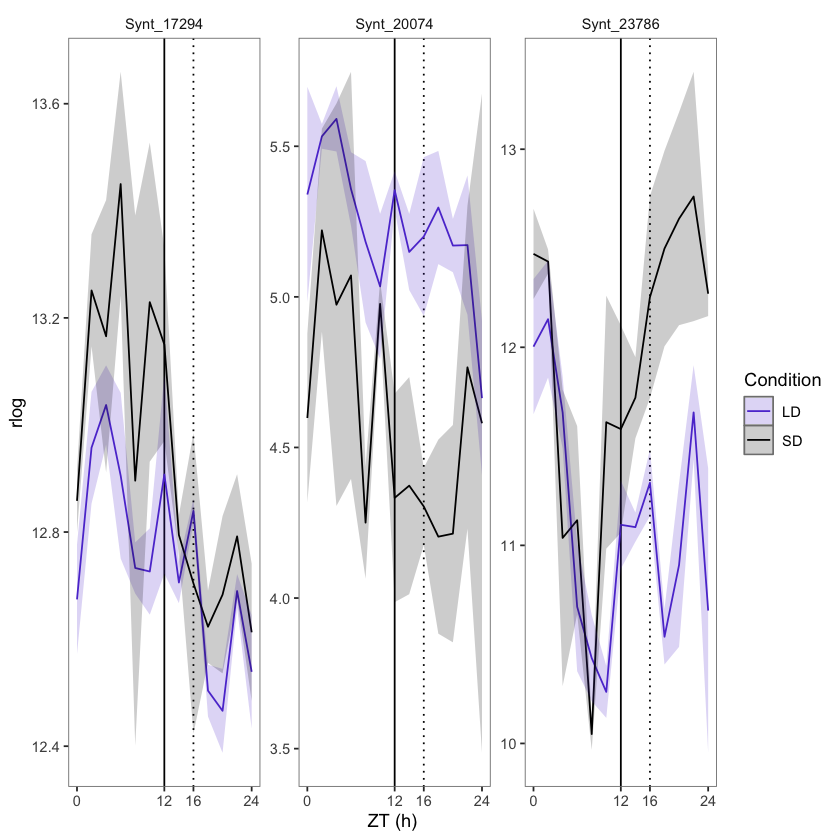

In [152]:
CHC_SPS <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_SPS

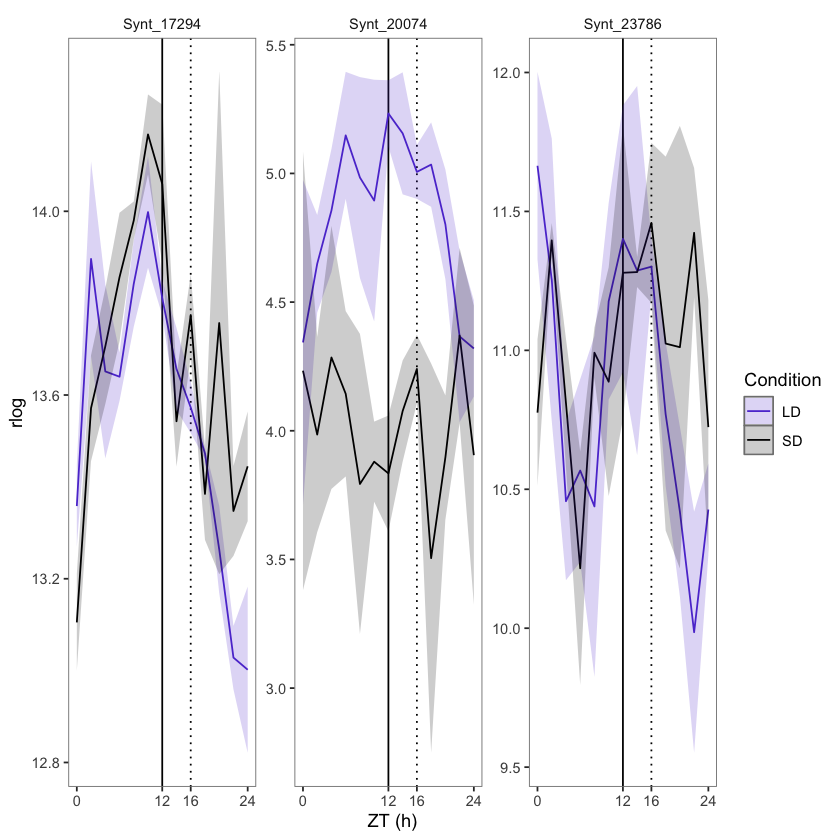

In [153]:
CND_SPS <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CND_SPS

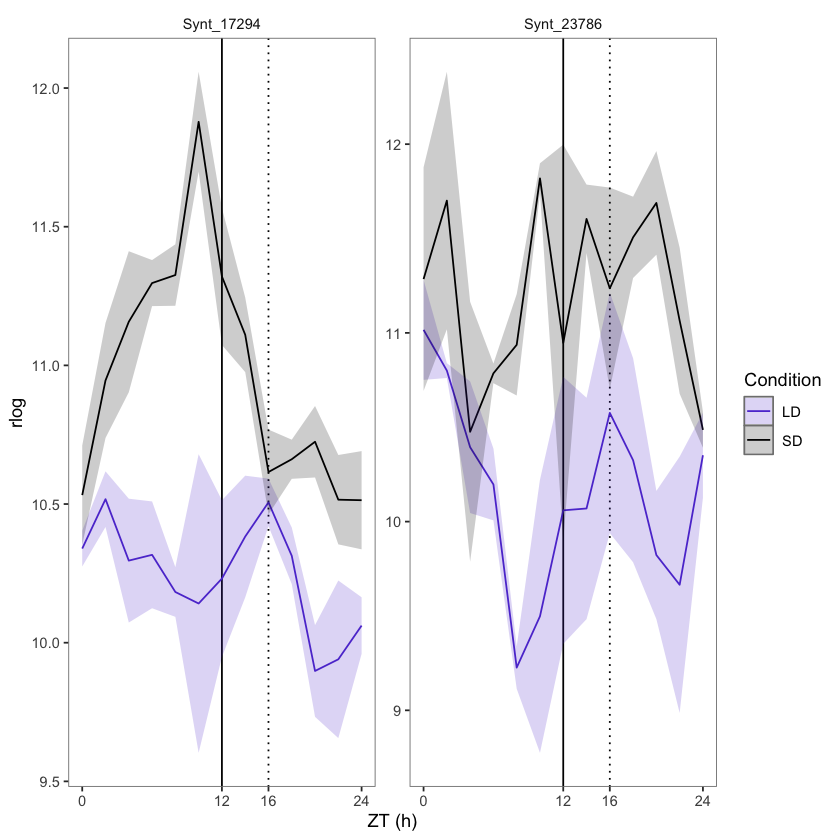

In [154]:
ATL_SPS <- All_CHO %>% 
            filter (Genome == 'ATL_H1', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_SPS

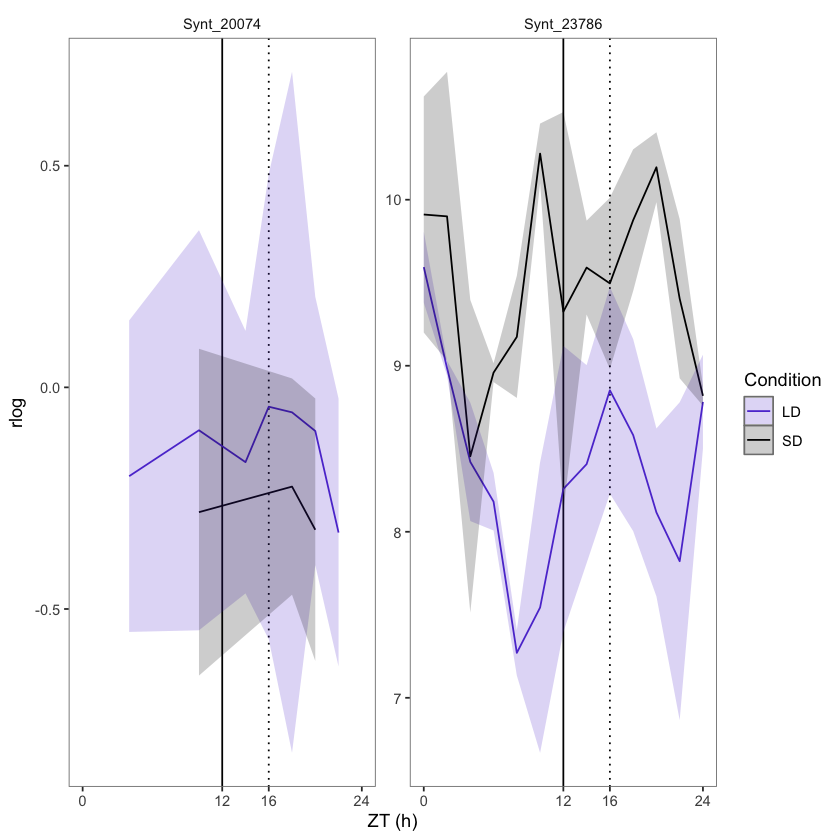

In [155]:
ATL_SPS <- All_CHO %>% 
            filter (Genome == 'ATL_H2', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_SPS

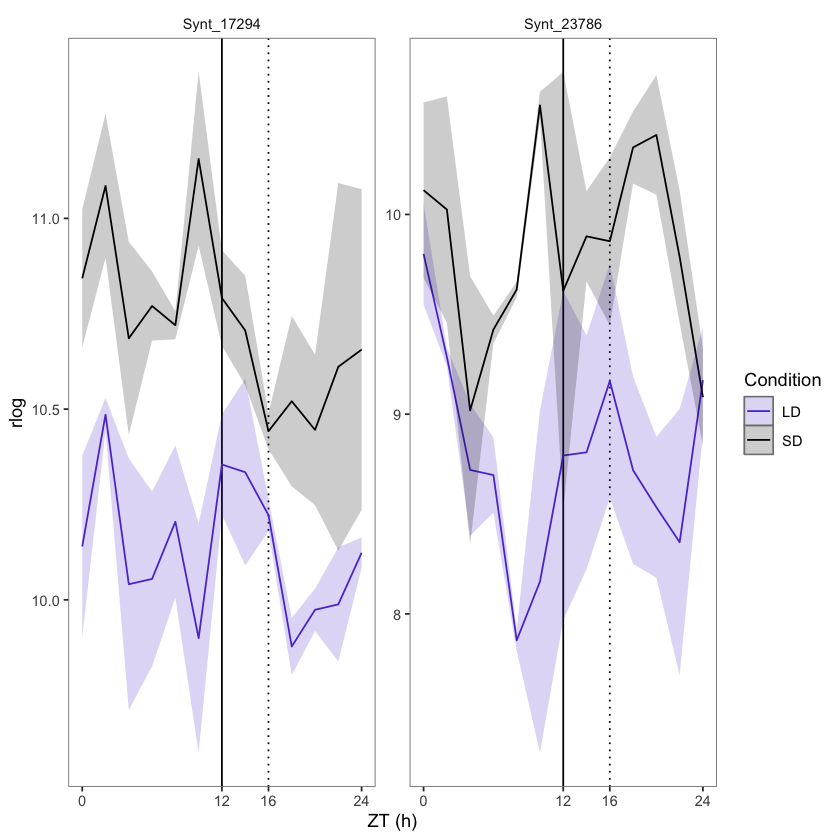

In [156]:
ATL_SPS <- All_CHO %>% 
            filter (Genome == 'ATL_H3', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_SPS

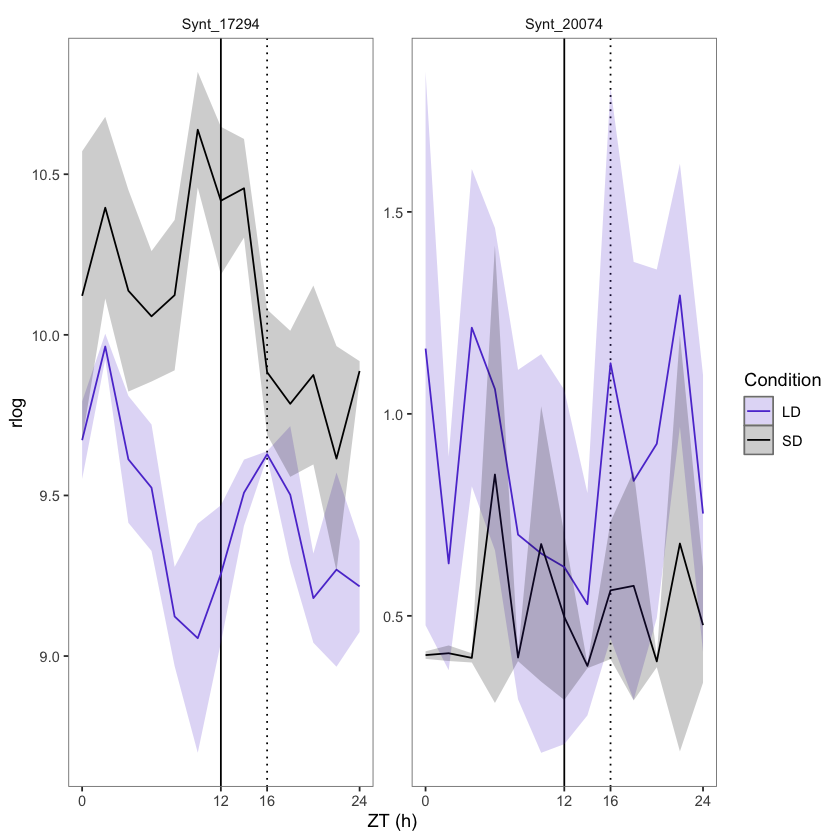

In [157]:
ATL_SPS <- All_CHO %>% 
            filter (Genome == 'ATL_H4', Tissue == 'Leaf', Syntelog %in% SPS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
ATL_SPS

In [ ]:
# Starch synthase

In [158]:
#Starch synthase
#::::::::::::::::::::::::::::::
CHO_annotation %>% filter(str_detect(v6.1_description, 'starch synthase')) #%>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_4856,starch synthase/starch synthase,2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_5281,starch synthase/starch synthase,2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_6235,starch synthase,2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_8223,"Glycogen/starch synthases, ADP-glucose type/Glycogen/starch synthases, ADP-glucose type/Glycogen/starch synthases, ADP-glucose type",2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_18165,starch synthase/starch synthase/starch synthase,2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [164]:
SS<-CHO_annotation %>% filter(str_detect(v6.1_description, 'starch synthase')) %>% select(Syntelog)

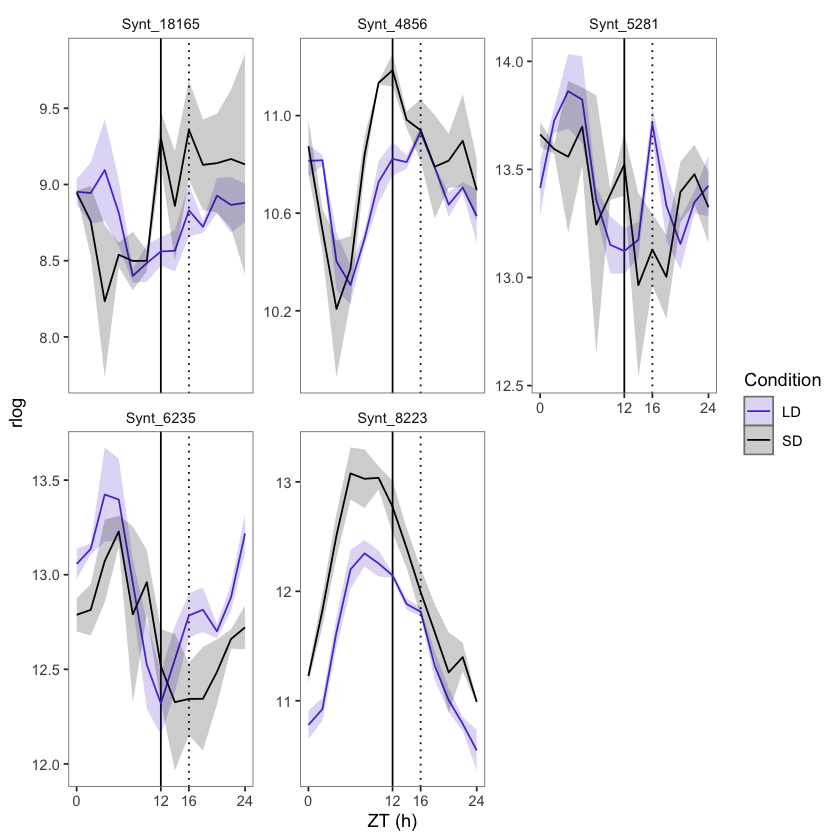

In [165]:
CHC_SS <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% SS$Syntelog ) %>% 
            LDSD_ribbon_plot_multiple(.,3)                
CHC_SS

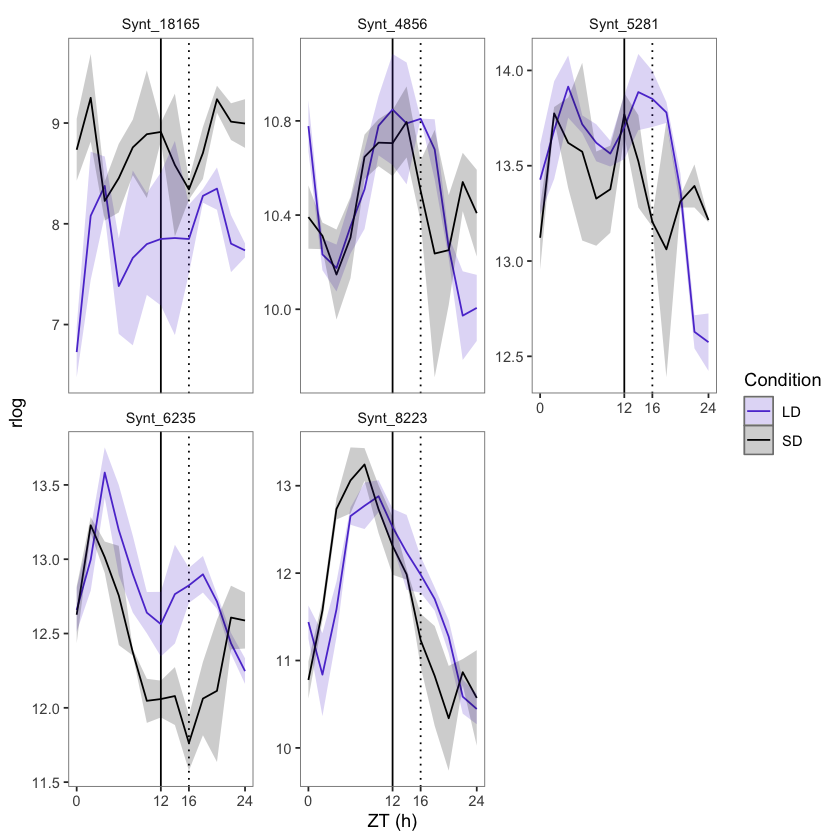

In [167]:
CND_SS <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% SS$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
CND_SS

# GWD

In [170]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'water dikinase'))# %>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_23851,"catalytics;carbohydrate kinases;phosphoglucan, water dikinases/catalytics;carbohydrate kinases;phosphoglucan, water dikinases",2.2.2.3 major CHO metabolism.degradation.starch.glucan water dikinase|2.2.2 major CHO metabolism.degradation.starch|2.2 major CHO metabolism.degradation|2 major CHO metabolism


In [173]:
GWD <- CHO_annotation %>% filter(str_detect(v6.1_description, 'water dikinase')) %>% select(Syntelog)

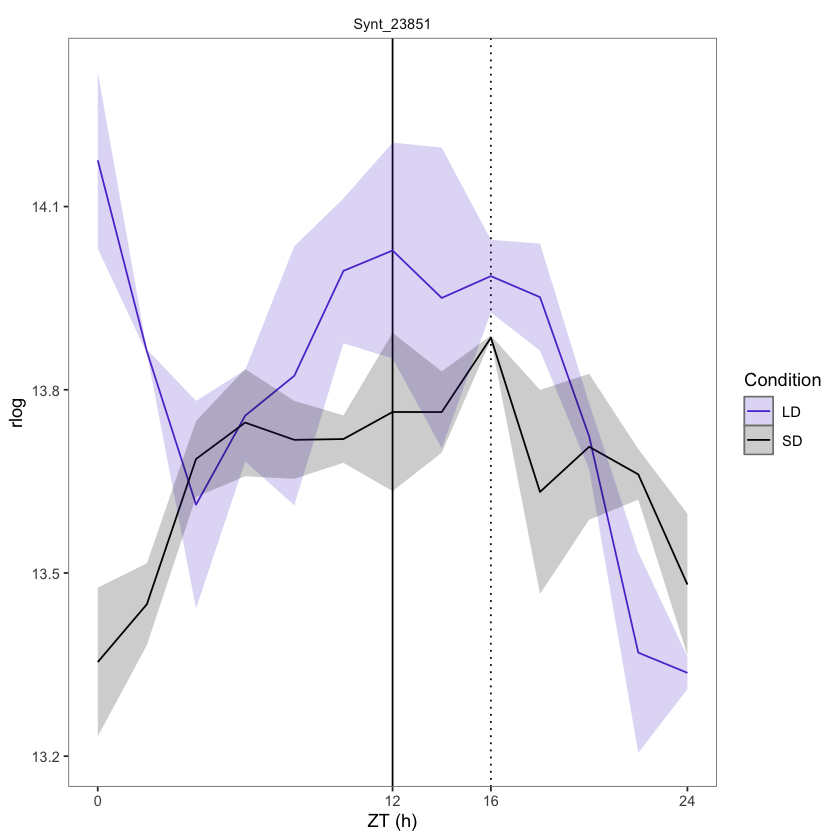

In [174]:
CND_GWD <- All_CHO %>% 
            filter (Genome == 'CND', Tissue == 'Leaf', Syntelog %in% GWD$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
CND_GWD

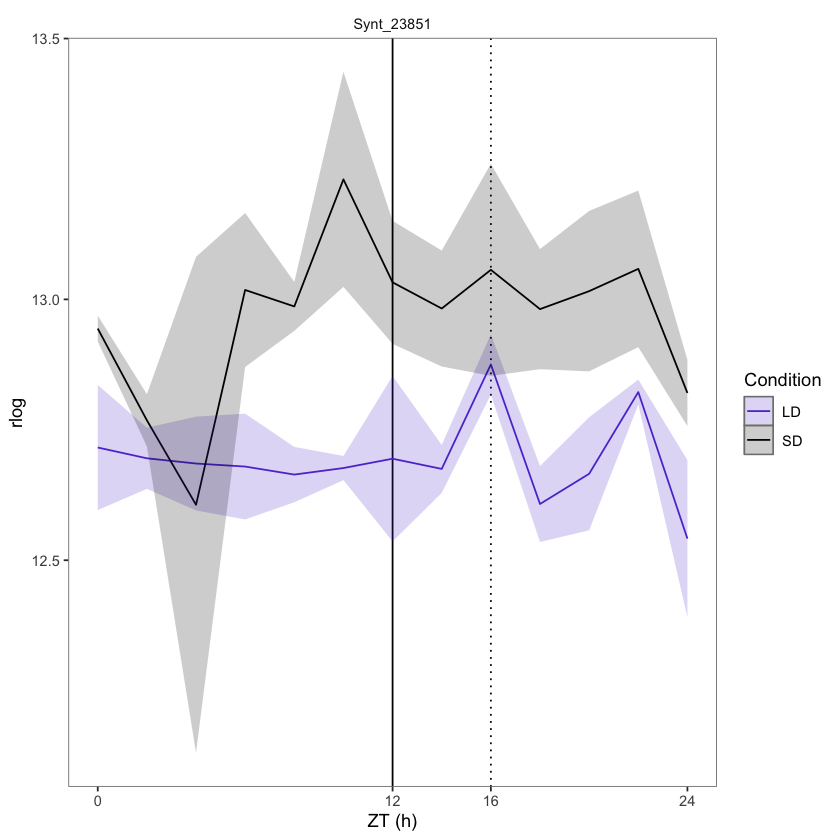

In [175]:
CHC_GWD <- All_CHO %>% 
            filter (Genome == 'CHC', Tissue == 'Leaf', Syntelog %in% GWD$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
CHC_GWD

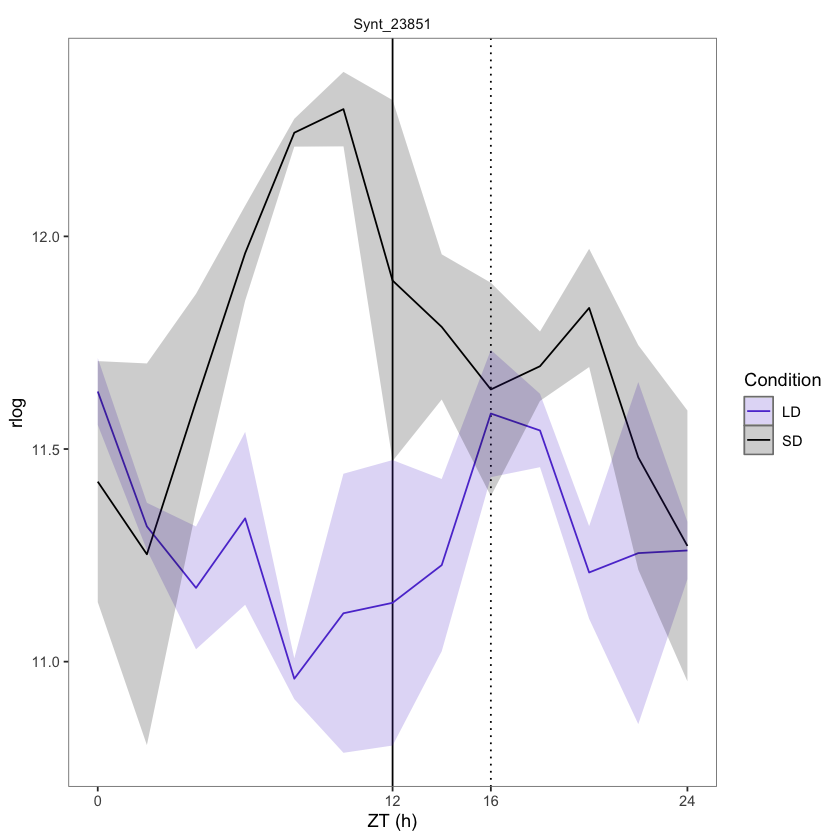

In [176]:
ATL_GWD <- All_CHO %>% 
            filter (Genome == 'ATL_H1', Tissue == 'Leaf', Syntelog %in% GWD$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
ATL_GWD

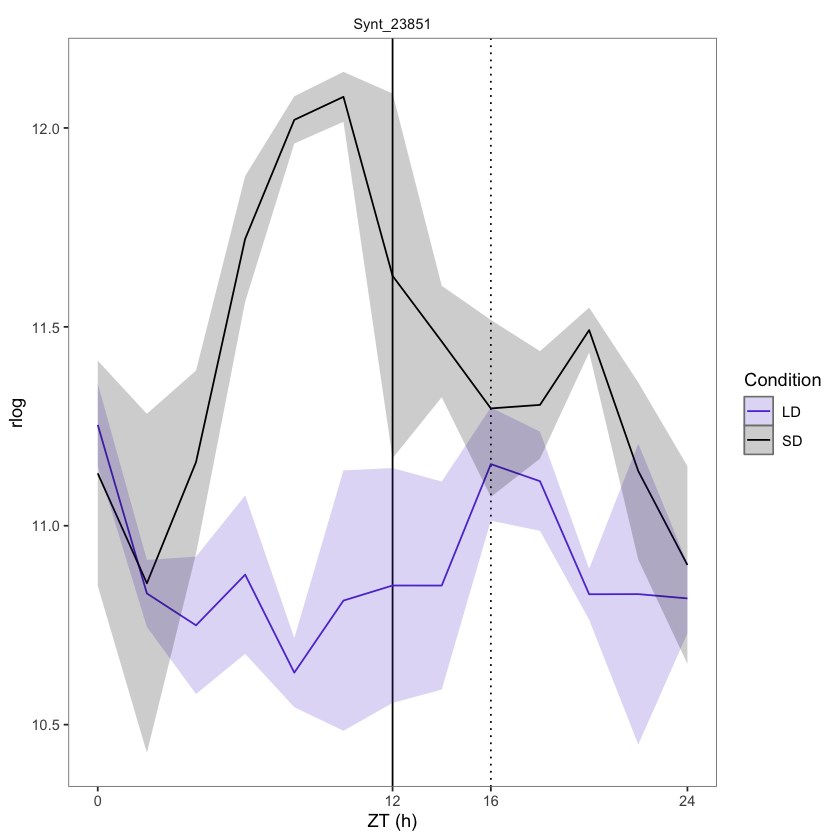

In [178]:
ATL_GWD <- All_CHO %>% 
            filter (Genome == 'ATL_H3', Tissue == 'Leaf', Syntelog %in% GWD$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
ATL_GWD

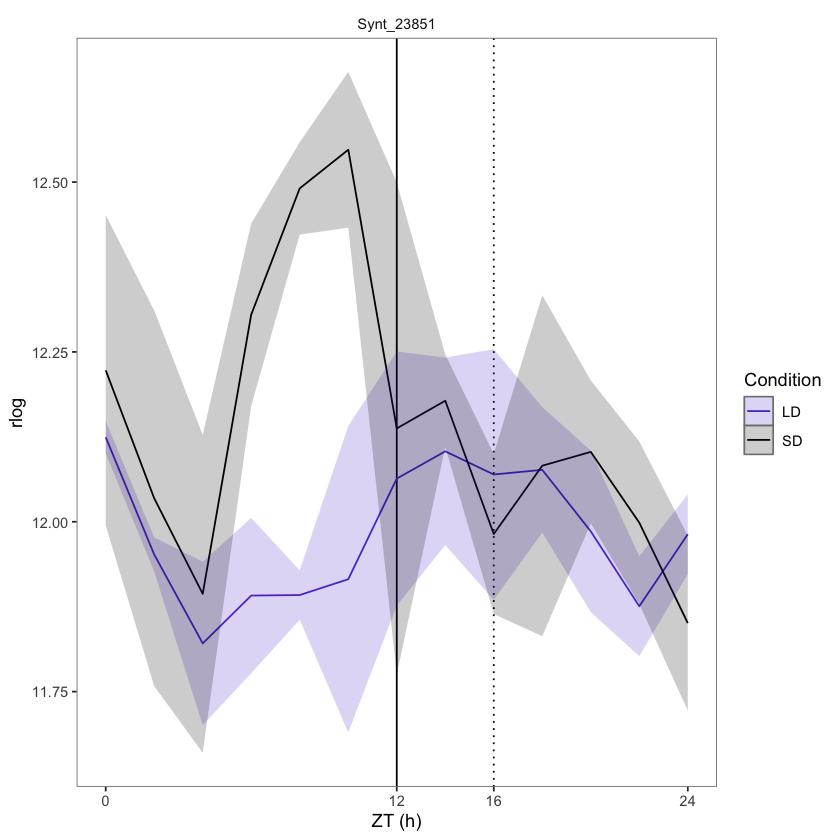

In [179]:
ATL_GWD <- All_CHO %>% 
            filter (Genome == 'ATL_H4', Tissue == 'Leaf', Syntelog %in% GWD$Syntelog ) %>% 
 LDSD_ribbon_plot_multiple(.,3) 
ATL_GWD

In [183]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'starch branching'))# %>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_12190,starch branching enzyme 2.1/starch branching enzyme 2.1,2.1.2.3 major CHO metabolism.synthesis.starch.starch branching|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_21829,starch branching enzyme 2.2/starch branching enzyme 2.2,2.1.2.3 major CHO metabolism.synthesis.starch.starch branching|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [184]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'ADP'))# %>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
Synt_1664,ADP glucose pyrophosphorylase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_8223,"Glycogen/starch synthases, ADP-glucose type/Glycogen/starch synthases, ADP-glucose type/Glycogen/starch synthases, ADP-glucose type",2.1.2.2 major CHO metabolism.synthesis.starch.starch synthase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_17863,ADPGLC-PPase large subunit/ADPGLC-PPase large subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_18774,ADP glucose pyrophosphorylase,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_30338,ADP glucose pyrophosphorylase/ADP glucose pyrophosphorylase,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism
Synt_19718,ADP-glucose pyrophosphorylase small subunit,2.1.2.1 major CHO metabolism.synthesis.starch.AGPase|2.1.2 major CHO metabolism.synthesis.starch|2.1 major CHO metabolism.synthesis|2 major CHO metabolism


In [185]:
CHO_annotation %>% filter(str_detect(v6.1_description, 'maltose'))# %>% select(Syntelog)

Syntelog,v6.1_description,MapManAll
<chr>,<chr>,<chr>
